In [5]:
import arviz as az
import bambi as bmb
import kulprit as kpt
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import preliz as pz
import pymc as pm
from scipy.interpolate import PchipInterpolator
from scipy.stats import linregress
import xarray as xr

import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)

In [6]:
az.style.use('arviz-doc')

In [3]:
%%HTML
<style>

.CodeMirror {
    width: 100vw;
}

.container {
    width: 99% !important;
}

.rendered_html {
  font-size:0.8em;
}
.rendered_html table, .rendered_html th, .rendered_html tr, .rendered_html td {
     font-size: 100%;
}


body {
  font-family: Ubuntu;
  background: #F0F0F0;
  background-color: #F0F0F0;
}


.reveal h1,
.reveal h2,
.reveal h3,
.reveal h4,
.reveal h5,
.reveal h6 {
  margin: 0 0 20px 0;
  color: #2a2eec;
  font-family: Ubuntu;
  line-height: 0.9em;
  letter-spacing: 0.02em;
  text-transform: none;
  text-shadow: none;
}

.reveal blockquote {
  display: block;
  position: relative;
  background: #fa7c17;
  border-radius: 15px;
  box-shadow: 0px 0px 2px rgba(0, 0, 0, 0.2);
  font-weight: bold;
}

</style>

In [4]:
from traitlets.config.manager import BaseJSONConfigManager
path = "/home/osvaldo/anaconda3/etc/jupyter/nbconfig"
cm = BaseJSONConfigManager(config_dir=path)
cm.update("livereveal", {
              "theme": "serif",
              "transition": "zoom",
              "start_slideshow_at": "selected",
              "controls": "True",
              "progress": "False",
              "shortcut": "False"});

<center><img src="img/Logo_UNSAM.png" width="200"></center>
<br>
<br>
<h1 align="center">Modelos lineales y generalizaciones</h1>    


<br>
<br>
<br>
<br>
<br>

## Objetivos

<br>
<br>


* Repaso sobre regresión lineal y modelos lineales generalizados
* Regresión jerárquica 
* Regresión polinómica y splines
* Interacciones
* Predictores categóricos
* Modelos distribucionales
* Cómo usar Bambi para construir y analizar modelos
* Selección de variables

## Regresión lineal

<br>
<br>

* Dada una variable $X$, queremos predecir o modelar una variable $Y$
* $X$ e $Y$ están apareadas $\{(x_1,y_1), (x_2,y_2), \dots (x_n,y_n)\}$

<br>
<br>

## Regresión lineal

<br>
<br>

* Modelar la relación entre la salinidad del suelo y la productividad de los cultivos. Luego, responder preguntas como: ¿Es la relación lineal? ¿Qué tan fuerte es esta relación?

* Encontrar una relación entre el consumo promedio de chocolate por país y el número de premios Nobel en ese país, y luego comprender por qué esta relación es probablemente espuria.

* Predecir la factura de gas de una casa utilizando la radiación solar del informe meteorológico local. ¿Qué tan precisa es esta predicción?


<br>
<br>

## La regresión lineal como una extensión del modelo Normal

<br>

$$
Y \sim \mathcal{N}(\mu, \sigma)
$$

> La idea central de la regresión lineal es extender este modelo, agregando una variable predictora $X$ a la estimación de la media $\mu$:

$$
\begin{aligned}
\mu &= \alpha + \beta X  \\
Y &\sim \mathcal{N}(\mu, \sigma)
\end{aligned}
$$

<br>
<br>

## Bicicletas lineales

<br>

* Tenemos un registro de temperaturas y del número de bicicletas alquiladas en una ciudad. 
* Queremos modelar la relación entre la temperatura y el número de bicicletas alquiladas. 
* Usaremos [bike-sharing dataset](https://archive.ics.uci.edu/ml/datasets/bike+sharing+dataset) del repositorio [UCI Machine Learning Repository](https://archive.ics.uci.edu/datasets). 
* El conjunto de datos original contiene 17379 registros, cada registro tiene 17 variables, pero para este ejemplo usaremos tan solo 348 registros y dos variables `temperatura` y `alquiladas`. 
* La variable `temperatura` es la temperatura en Celsius y `alquiladas` es el número de bicicletas alquiladas. 

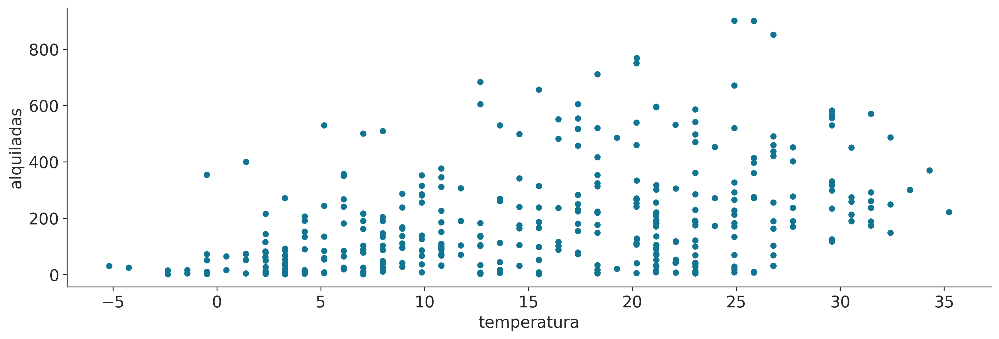

In [5]:
bicis = pd.read_csv("../datos/bicis.csv")

bicis.plot(x="temperatura", y="alquiladas", kind="scatter", figsize=(12, 4));

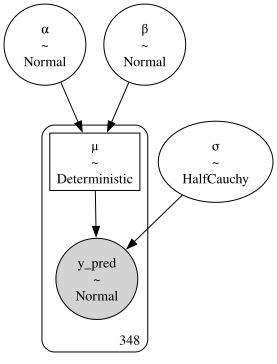

In [6]:
with pm.Model() as modelo_bl:
    α = pm.Normal('α', mu=0, sigma=100)
    β = pm.Normal('β', mu=0, sigma=10)
    σ = pm.HalfCauchy('σ', 10)
    μ = pm.Deterministic('μ', α + β * bicis.temperatura)
    _ = pm.Normal('y_pred', mu=μ, sigma=σ, observed=bicis.alquiladas)

pm.model_to_graphviz(modelo_bl)

In [7]:
with modelo_bl:
    idata_bl = pm.sample(random_seed=123)

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [α, β, σ]


Output()

Sampling 4 chains for 1_000 tune and 1_000 draw iterations (4_000 + 4_000 draws total) took 3 seconds.


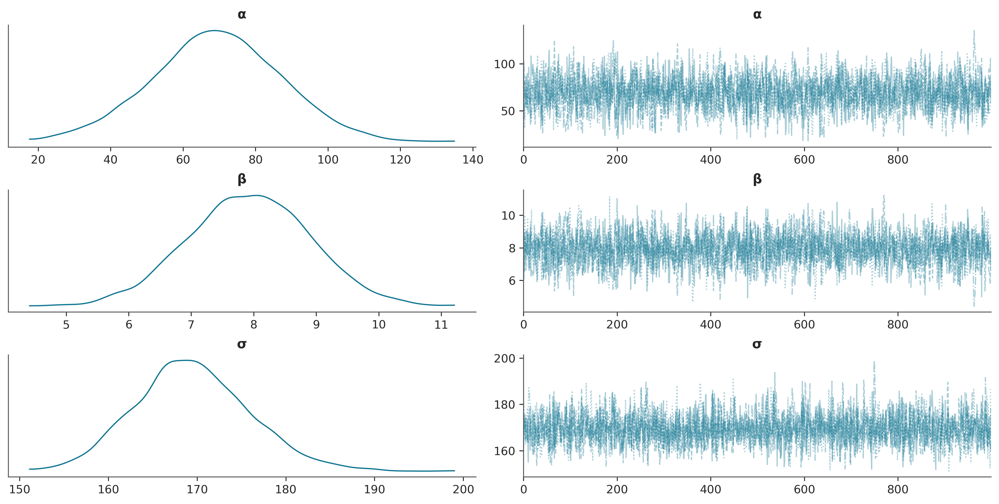

In [8]:
az.plot_trace(idata_bl, combined=True, figsize=(12, 6), var_names="~μ");

In [9]:
idata_bl

Inference data with groups:
	> posterior
	> sample_stats
	> observed_data

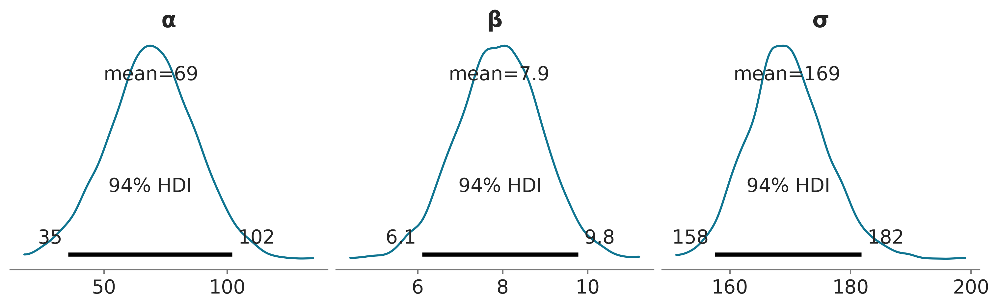

In [10]:
az.plot_posterior(idata_bl, var_names=['~μ'], figsize=(10, 3));

Si solo leemos las medias de cada distribución podemos decir que $\mu = 69 + 7,9 X$

* El valor esperado de bicicletas alquiladas cuando la temperatura es 0 es de 69
* Por cada grado de temperatura el número de bicicletas alquiladas aumenta en $\approx 8$
* Así que para una temperatura de 28 grados esperamos alquilar $69 + 7.9 * 28 \approx 290$ bicicletas

* Si tenemos en cuenta la incertidumbre para $\beta$. Por cada grado el número de bicicletas alquiladas podría aumentar entre 6 a unas 10

* Incluso si omitimos la incertidumbre a posteriori, $\sigma \approx 170$. Entonces, si decimos que para una temperatura de 28 grados, esperamos alquilar 290 bicicletas, no debería sorprendernos que el número real resulte estar entre $\approx 100$ y $\approx 500$ bicicletas.

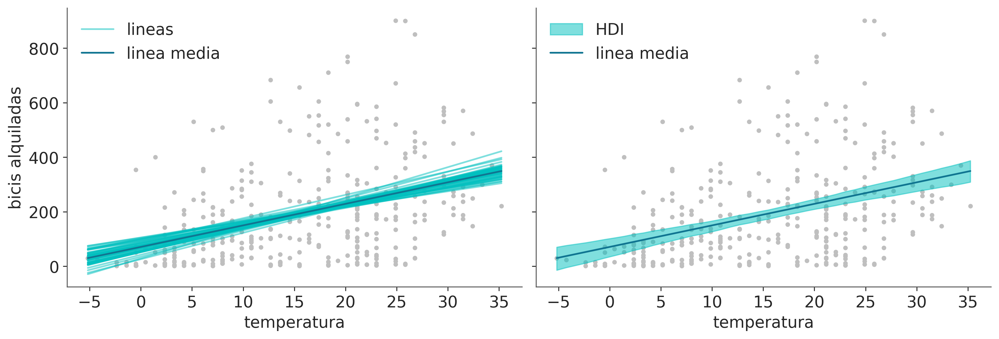

In [11]:
posterior = az.extract(idata_bl, num_samples=50)
x_plot = xr.DataArray(np.linspace(bicis.temperatura.min(), bicis.temperatura.max(), 50), dims="plot_id")
linea_media = posterior['α'].mean() + posterior['β'].mean() * x_plot
lineas = posterior['α'] + posterior['β'] * x_plot
hdi_lines = az.hdi(idata_bl.posterior['μ'])


fig, axes = plt.subplots(1, 2, figsize=(12, 4), sharey=True)
axes[0].plot(bicis.temperatura, bicis.alquiladas,  '.', color="0.75",  zorder=-3)
lines_ = axes[0].plot(x_plot, lineas.T, c='C1', alpha=0.5, label='lineas')
plt.setp(lines_[1:], label="_")
axes[0].plot(x_plot, linea_media, c='C0', label='linea media')
axes[0].set_xlabel('temperatura')
axes[0].set_ylabel('bicis alquiladas')
axes[0].legend()

axes[1].plot(bicis.temperatura, bicis.alquiladas, '.', color="0.75",  zorder=-3)
idx = np.argsort(bicis.temperatura.values)
axes[1].fill_between(bicis.temperatura[idx], hdi_lines["μ"][:,0][idx], hdi_lines["μ"][:,1][idx],
                     color="C1", label='HDI', alpha=0.5)
axes[1].plot(x_plot, linea_media, c='C0', label='linea media')
axes[1].set_xlabel('temperatura')
axes[1].legend();

### Interpretando las predicciones a posteriori

<br>
<br>

¿Qué pasa si no solo estamos interesados en el valor esperado (promedio), sino que queremos pensar en términos de predicciones?

<br>
<br>

In [12]:
pm.sample_posterior_predictive(idata_bl, model=modelo_bl, extend_inferencedata=True, random_seed=123);

Sampling: [y_pred]


Output()

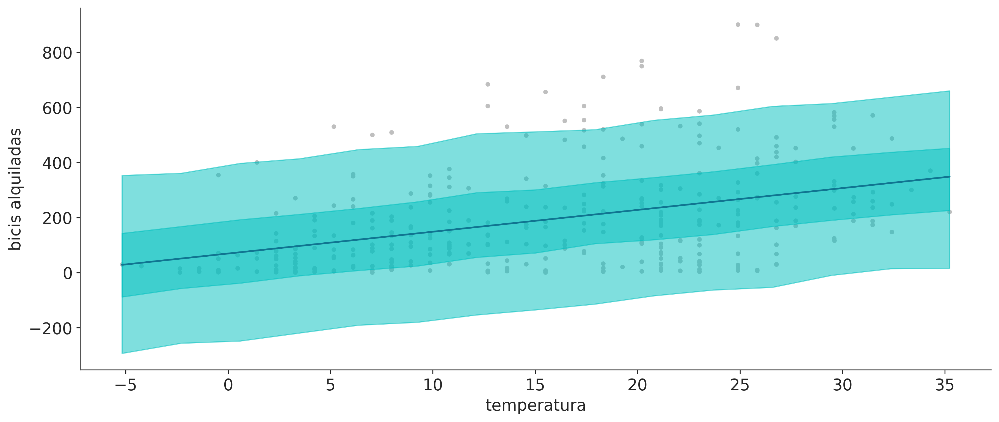

In [13]:
linea_media = idata_bl.posterior['μ'].mean(("chain", "draw"))
idx = np.argsort(bicis.temperatura.values)
x = np.linspace(bicis.temperatura.min(), bicis.temperatura.max(), 15)
y_pred_q = idata_bl.posterior_predictive['y_pred'].quantile([0.03, 0.97, 0.25, 0.75], dim=['chain', 'draw'])
y_hat_bounds = iter([PchipInterpolator(bicis.temperatura.values[idx], y_pred_q[i][idx])(x) for i in range(4)])

_, ax = plt.subplots(figsize=(12, 5))
ax.plot(bicis.temperatura, bicis.alquiladas, '.', color="0.75",  zorder=-3)
ax.plot(bicis.temperatura[idx], linea_media[idx], c='C0')

for lb, ub in zip(y_hat_bounds, y_hat_bounds): 
    ax.fill_between(x,
                    lb, ub,
                    color="C1", alpha=0.5)


ax.set_xlabel('temperatura')
ax.set_ylabel('bicis alquiladas');

## Generalizando el modelo lineal


De forma general (y omitiendo priors), podemos escribir un GLM como:

$$
\begin{aligned}
\mu &= \alpha + \beta X \\
Y &\sim \phi(f(\mu), \theta)
\end{aligned}
$$

* $\phi$ es una distribución arbitraria algunos casos comunes son Normal, Student's T, Gamma, NegativeBinomial
* $\theta$ representa cualquier parámetro *auxiliar* que pueda tener la distribución
* También tenemos $f$, generalmente llamada función de enlace inverso. Y que garantiza que $\mu$ pueda ser usado como parámetro de $\phi$

## Generalizando el modelo lineal para datos de conteo

* $\phi$ va a ser una NegativaBinomial
* $\theta$ va a representa a el parámetro de dispersión de la NegativaBinomial
* También tenemos $f=\exp$, que garantiza que $\mu$ sea positivo.

In [14]:
with pm.Model() as modelo_neg:
    α = pm.Normal('α', mu=0, sigma=100)
    β = pm.Normal('β', mu=0, sigma=10)
    σ = pm.HalfCauchy('σ', 10)
    μ = pm.Deterministic('μ', pm.math.exp(α + β * bicis.temperatura))
    y_pred = pm.NegativeBinomial('y_pred', mu=μ, alpha=σ, observed=bicis.alquiladas)
    idata_neg = pm.sample(random_seed=123)
    idata_neg.extend(pm.sample_posterior_predictive(idata_neg, random_seed=123))

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [α, β, σ]


Output()

Sampling 4 chains for 1_000 tune and 1_000 draw iterations (4_000 + 4_000 draws total) took 3 seconds.
Sampling: [y_pred]


Output()

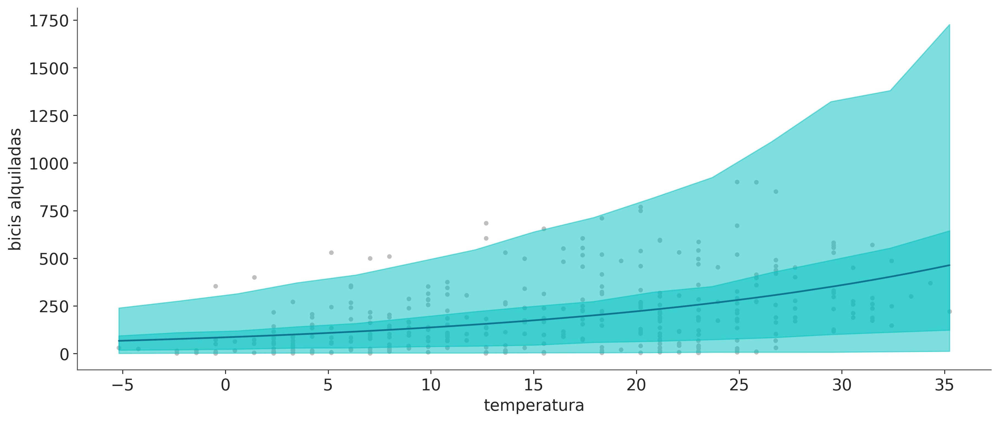

In [15]:
linea_media = idata_neg.posterior['μ'].mean(("chain", "draw"))
idx = np.argsort(bicis.temperatura.values)
x = np.linspace(bicis.temperatura.min(), bicis.temperatura.max(), 15)
y_pred_q = idata_neg.posterior_predictive['y_pred'].quantile([0.03, 0.97, 0.25, 0.75], dim=['chain', 'draw'])
y_hat_bounds = iter([PchipInterpolator(bicis.temperatura.values[idx], y_pred_q[i][idx])(x) for i in range(4)])

_, ax = plt.subplots(figsize=(12, 5))
ax.plot(bicis.temperatura, bicis.alquiladas, '.', color="0.75", zorder=-3)
ax.plot(bicis.temperatura[idx], linea_media[idx], c='C0')

for lb, ub in zip(y_hat_bounds, y_hat_bounds): 
    ax.fill_between(x,
                    lb, ub,
                    color="C1", alpha=0.5)

ax.set_xlabel('temperatura')
ax.set_ylabel('bicis alquiladas');

### Posterior predictive checks

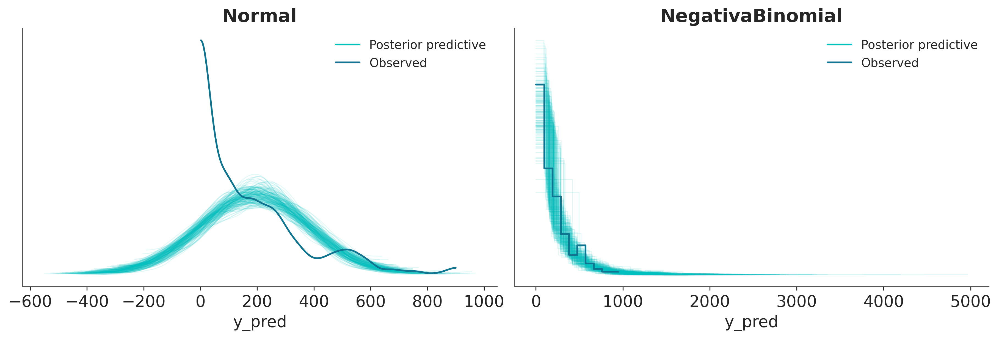

In [16]:
_, ax = plt.subplots(1, 2, figsize=(12, 4))
az.plot_ppc(idata_bl,  num_pp_samples=200,  alpha=0.1, colors=["C1", "C0", "C0"], ax=ax[0], mean=False)
az.plot_ppc(idata_neg, num_pp_samples=200,  alpha=0.1, colors=["C1", "C0", "C0"], ax=ax[1], mean=False)
ax[0].set_title("Normal")
ax[1].set_title("NegativaBinomial");

## Regresión robusta

<br>
<br>

* Podemos elegir $\phi$ por conveniencia estadística
* Por ejemplo una distribución Normal es muy sensible a valores atípicos
* Una distribución T de Student es "similar" a una Normal pero con una cola potencialmente más pesada, lo que la hace menos sensible a valores atípicos

<br>
<br>

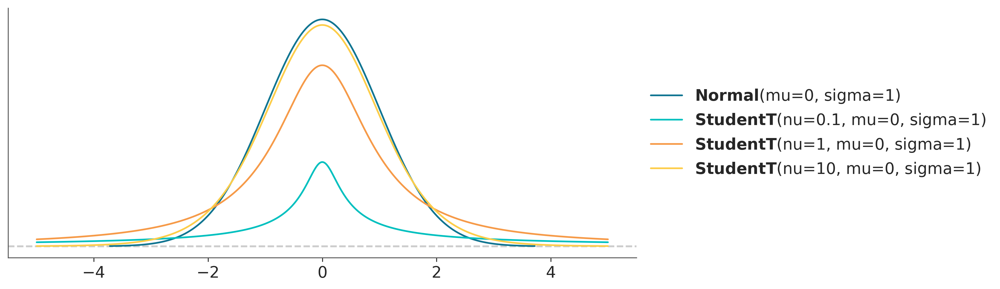

In [17]:
pz.Normal(0, 1).plot_pdf(figsize=(10, 4))
#pz.StudentT(np.inf, 0, 1).plot_pdf()

pz.StudentT(0.1, 0, 1).plot_pdf(support=(-5, 5))
pz.StudentT(1, 0, 1).plot_pdf(support=(-5, 5))
pz.StudentT(10, 0, 1).plot_pdf(support=(-5, 5));

## Cuarteto de Anscombe

<br>
<br>

* Para ejemplificar la robustez que la distribución T de Student aporta a la regresión lineal, vamos a utilizar un conjunto de datos muy simple. 

* Una versión ligeramente modificada del tercer grupo de datos del [cuarteto de Anscombe](https://en.wikipedia.org/wiki/Anscombe%27s_quartet).

<br>
<br>

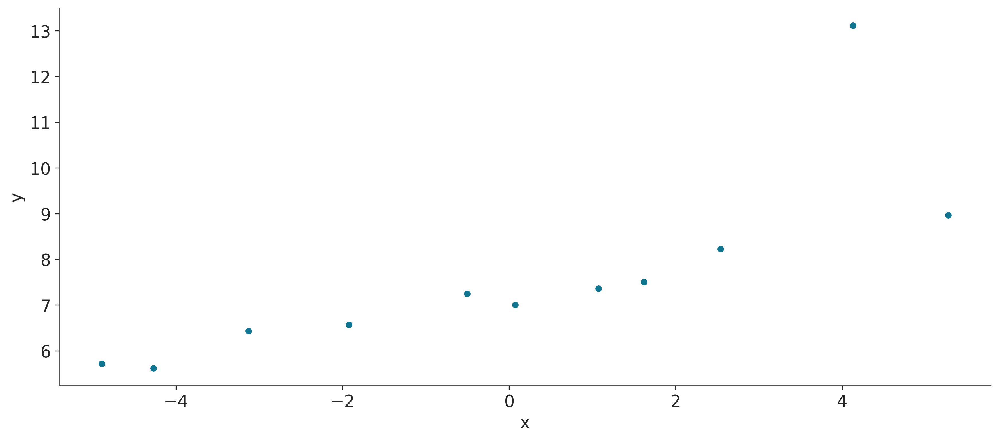

In [18]:
ans = pd.read_csv('../datos/anscombe_3.csv')
ans.plot("x", "y", kind="scatter");

In [19]:
with pm.Model() as modelo_t:
    α = pm.Normal('α', mu=ans.y.mean(), sigma=1)
    β = pm.Normal('β', mu=0, sigma=1)
    σ = pm.HalfNormal('σ', 5)
    ν_ = pm.Exponential('ν_', 1/29)
    ν = pm.Deterministic('ν', ν_ + 1)
    μ = pm.Deterministic('μ', α + β * ans.x)
    _ = pm.StudentT('y_pred', mu=μ, sigma=σ, nu=ν, observed=ans.y)
    idata_t = pm.sample(2000, random_seed=123)

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [α, β, σ, ν_]


Output()

Sampling 4 chains for 1_000 tune and 2_000 draw iterations (4_000 + 8_000 draws total) took 4 seconds.


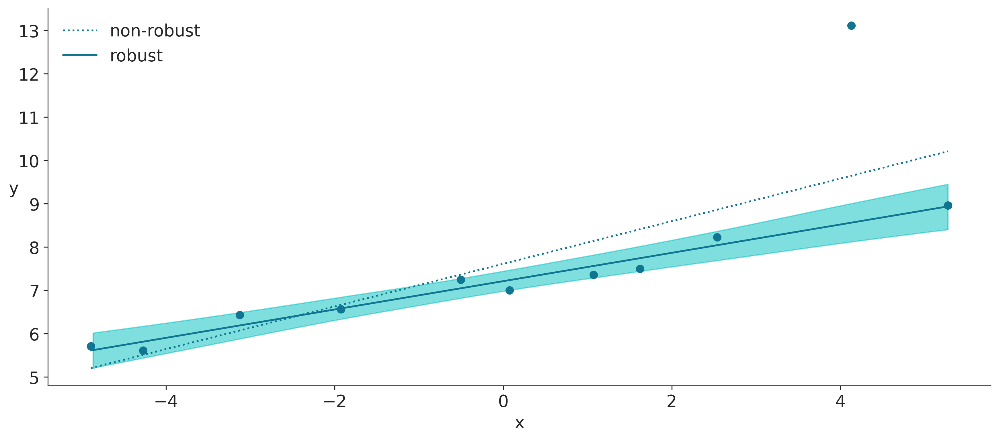

In [20]:
beta_c, alpha_c, *_ = linregress(ans.x, ans.y)

_, ax = plt.subplots()
ax.plot(ans.x, (alpha_c + beta_c * ans.x), 'C0:', label='non-robust')
ax.plot(ans.x, ans.y, 'C0o')
alpha_m = idata_t.posterior['α'].mean(("chain", "draw"))
beta_m = idata_t.posterior['β'].mean(("chain", "draw"))

x_plot = xr.DataArray(np.linspace(ans.x.min(), ans.x.max(), 50), dims="plot_id")
ax.plot(x_plot, alpha_m + beta_m * x_plot, c='C0', label="robust")
az.plot_hdi(ans.x, az.hdi(idata_t.posterior['μ'])['μ'].T, ax=ax)
ax.set_xlabel('x')
ax.set_ylabel('y', rotation=0)
ax.legend(loc=2);

Sampling: [y_pred]


Output()

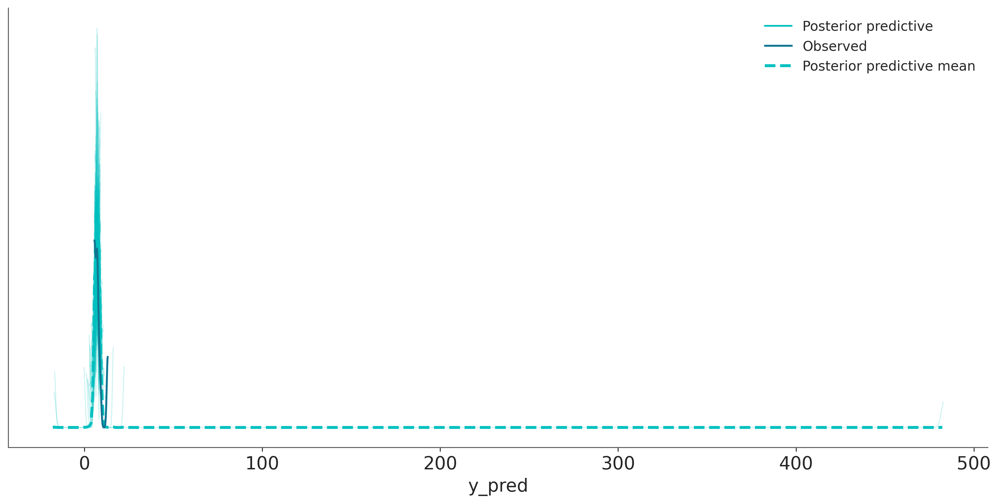

In [21]:
pm.sample_posterior_predictive(idata_t, model=modelo_t, random_seed=2, extend_inferencedata=True)
ax = az.plot_ppc(idata_t, num_pp_samples=200, figsize=(12, 6),  colors=["C1", "C0", "C1"])

## Regresión logística

<br>


La regresión logistica es la generalización del modelo de regresión simple para cuando la variable dependiente es binaria. Esta generalización se logra en dos pasos. Primero utilizamos la funcion logística como función inversa de enlace:

$$ \text{logística}(z) = \frac{1}{1 + e^{-z}} $$


Usamos esta función por que una de sus propiedades es que no importa el valor del argumento $z$, el resultado siempre será un valor en el intervalo [0, 1]. La función logística es conocida también como función sigmoide, por su aspecto típico de _S_ como se puede ver al ejecutar la siguiente celda:

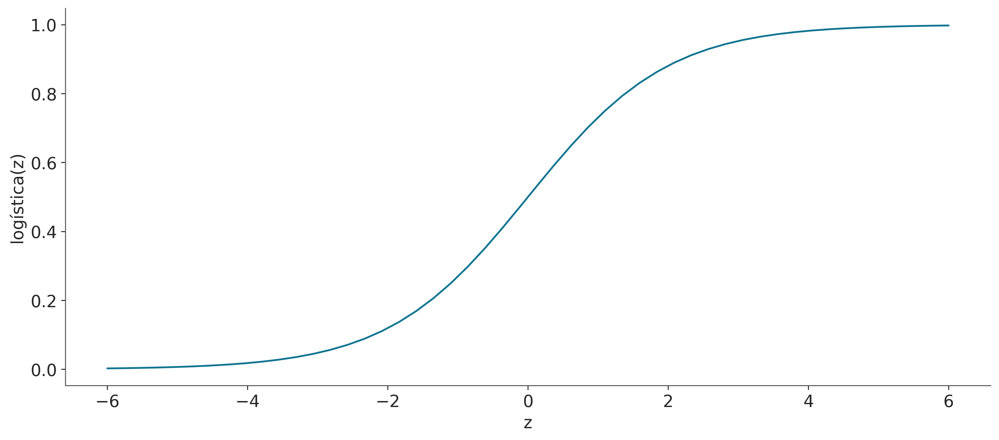

In [22]:
z = np.linspace(-6, 6)
logística = 1 / (1 + np.exp(-z))
plt.plot(z, logística)
plt.xlabel('z')
plt.ylabel('logística(z)');

El segundo paso consiste en usar como likelihood una distribución binomial y no una Gaussiana. De esta forma el modelo queda expresado como: 

$$
\begin{aligned}
\theta &= \text{logística}(\alpha + \beta X) \\
Y &\sim \text{Bern}(\theta)
\end{aligned}
$$

Este modelo se puede explicar de la siguiente forma. Si nuestros datos son binarios $y \in \{0, 1\}$, como con el ejemplo de la moneda, vemos que tiene sentido usar una distribución Bernoulli. Esta distribución está parametrizada por un único parámetro en el intervalo [0, 1], el cual puede ser generado desde un modelo lineal siempre y cuando los valores generados por el modelo lineal sean _comprimidos_ al intervalo [0, 1], algo que puede ser obtenido al emplear una función logística.

## El modelo logístico aplicado al conjunto de datos del iris.


In [23]:
iris = pd.read_csv('../datos/iris.csv')
iris.head()

,sepal_length,sepal_width,petal_length,petal_width,species
0,5.1,3.5,1.4,0.2,setosa
1,4.9,3.0,1.4,0.2,setosa
2,4.7,3.2,1.3,0.2,setosa
3,4.6,3.1,1.5,0.2,setosa
4,5.0,3.6,1.4,0.2,setosa


In [24]:
df = iris.query("species == ('setosa', 'versicolor')")
y_0 = pd.Categorical(df['species']).codes
x_n = 'sepal_length' 
x_0 = df[x_n].values
x_c = x_0 - x_0.mean()

In [25]:
with pm.Model() as modelo_rl:
    α = pm.Normal('α', mu=0, sigma=1)
    β = pm.Normal('β', mu=0, sigma=5)
    
    μ = α + β * x_c   
    θ = pm.Deterministic('θ', pm.math.sigmoid(μ))
    bd = pm.Deterministic('bd', -α/β)
    
    yl = pm.Bernoulli('yl', p=θ, observed=y_0)

    idata_rl = pm.sample(random_seed=123)

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [α, β]


Output()

Sampling 4 chains for 1_000 tune and 1_000 draw iterations (4_000 + 4_000 draws total) took 1 seconds.


In [26]:
az.summary(idata_rl, var_names='~θ')

,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
bd,-0.050,0.059,-0.160,0.064,0.001,0.001,3673.0,2726.0,1.0
α,0.265,0.307,-0.294,0.852,0.005,0.004,3615.0,2750.0,1.0
β,5.187,1.012,3.462,7.241,0.018,0.014,3180.0,2344.0,1.0


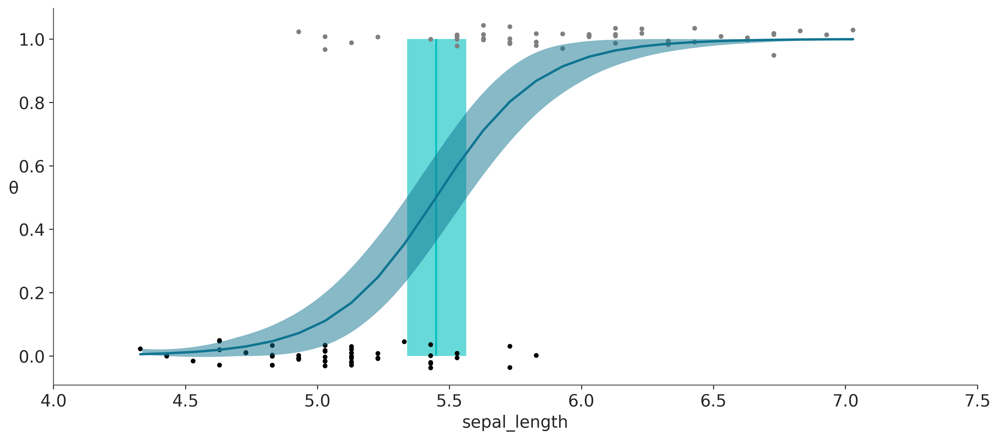

In [27]:
posterior = idata_rl.posterior
theta = posterior["θ"].mean(("chain", "draw"))
idx = np.argsort(x_c)

_, ax = plt.subplots()

ax.plot(x_c[idx], theta[idx], color='C0', lw=2)
ax.vlines(posterior['bd'].mean(("chain", "draw")), 0, 1, color='C1', zorder=0)
bd_hdi = az.hdi(posterior['bd'])
ax.fill_betweenx([0, 1], bd_hdi["bd"][0], bd_hdi["bd"][1], color='C1', alpha=0.6, lw=0)
ax.scatter(x_c, np.random.normal(y_0, 0.02), marker='.', color=[f'{0.5*x}' for x in y_0])
az.plot_hdi(x_c, posterior['θ'], color='C0', ax=ax, fill_kwargs={"lw": 0})
ax.set_xlabel(x_n)
ax.set_ylabel('θ', rotation=0)
# usar escala original para los xticks
locs, _ = plt.xticks()
ax.set_xticks(locs, np.round(locs + x_0.mean(), 1));

## GLMs


De forma general (y omitiendo priors), podemos escribir un GLM como:

$$
\begin{aligned}
\mu &= \alpha + \beta X \\
Y &\sim \phi(f(\mu), \theta)
\end{aligned}
$$

* $\phi$ es una distribución arbitraria algunos casos comunes son Normal, Student's T, Gamma, NegativeBinomial
* $\theta$ representa cualquier parámetro *auxiliar* que pueda tener la distribución
* También tenemos $f$, generalmente llamada función de enlace inverso. Y que garantiza que $\mu$ pueda ser usado como parámetro de $\phi$

## Varianza variable (heterocedasticidad)

<br>
<br>

* En los ejemplos anteriores usamos el término lineal para modelar media (o en general la "localización")


* Podemos modelar otros parámetros de una distribución, por ejemplo la varianza.

<br>
<br>

## Longitud de bebes

<br>

* Monitorear el crecimiento adecuado de recién nacidos es crucial para la detección temprana de problemas de salud.

* La OMS y otras instituciones recopilan datos para recién nacidos y diseñan estándares de crecimiento. 

* Estas tablas son un componente esencial del conjunto de herramientas pediátricas y también como una medida del bienestar general de las poblaciones con el fin de formular políticas de salud, planificar intervenciones y controlar su eficacia.

<br>

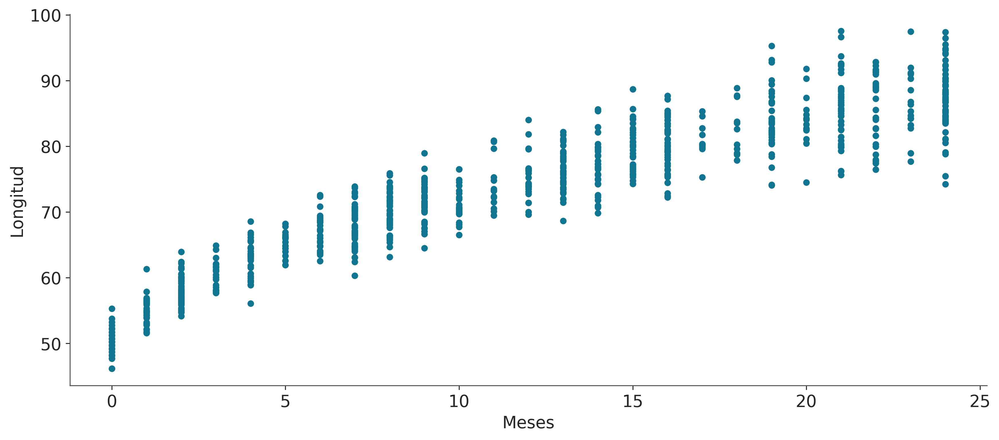

In [28]:
datos = pd.read_csv('../datos/babies.csv')
datos.plot.scatter('Meses', 'Longitud');

Para modelar estos datos, presentaremos 3 nuevos elementos:

<br>

* $\sigma$ es una función lineal de $X$, y para hacer esto agregamos dos nuevos parámetros $\gamma$ y $\delta$, estos son análogos directos de $\alpha$ y $\beta$.
* Transformanos las $X$ (meses) usando $\sqrt{X}$.

<br>


* Hemos definido una variable compartida `x_shared`, esto nos permitirá cambiar los valores de la variable $X$ (`Meses` en este ejemplo) sin la necesidad de volver a muestrear el modelo. Esto quedará más claro con el ejemplo.

<br>

In [29]:
with pm.Model() as model_vv:
    x_shared = pm.MutableData("x_shared", datos.Meses.values.astype(float))
    α = pm.Normal('α', sigma=10)
    β = pm.Normal('β', sigma=10)
    γ = pm.HalfNormal('γ', sigma=10)
    δ = pm.HalfNormal('δ', sigma=10)

    μ = pm.Deterministic('μ', α + β * x_shared**0.5)
    σ = pm.Deterministic('σ', γ + δ * x_shared)
    
    y_pred = pm.Normal('y_pred', mu=μ, sigma=σ, observed=datos.Longitud)
    
    idata_vv = pm.sample(random_seed=123)

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [α, β, γ, δ]


Output()

Sampling 4 chains for 1_000 tune and 1_000 draw iterations (4_000 + 4_000 draws total) took 3 seconds.


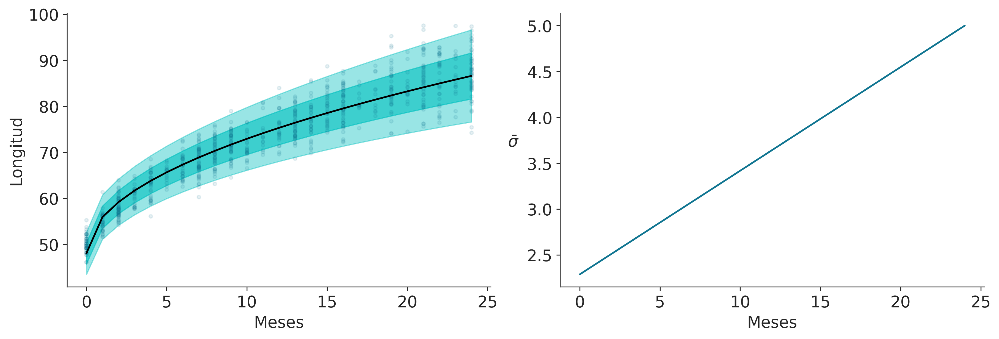

In [30]:
_, axes = plt.subplots(1, 2, figsize=(12, 4))

axes[0].plot(datos.Meses, datos.Longitud, 'C0.', alpha=0.1);

posterior = az.extract(idata_vv)

μ_m = posterior['μ'].mean("sample").values
σ_m = posterior['σ'].mean("sample").values

axes[0].plot(datos.Meses, μ_m, c='k')
axes[0].fill_between(datos.Meses, μ_m + 1 * σ_m, μ_m - 1 * σ_m, alpha=0.6, color='C1')
axes[0].fill_between(datos.Meses, μ_m + 2 * σ_m, μ_m - 2 * σ_m, alpha=0.4, color='C1')

axes[0].set_xlabel('Meses')
axes[0].set_ylabel('Longitud');


axes[1].plot(datos.Meses, σ_m)
axes[1].set_xlabel('Meses');
axes[1].set_ylabel(r'$\bar σ$', rotation=0, labelpad=12);

In [31]:
with model_vv:
    pm.set_data({"x_shared": [0.5]})
    ppc = pm.sample_posterior_predictive(idata_vv, random_seed=123)
    y_ppc = ppc.posterior_predictive['y_pred'].stack(sample=("chain", "draw"))

Sampling: [y_pred]


Output()

Ahora podemos graficar la distribución esperada de las longitudes para las bebas con 2 semanas de vida y calcular cantidades adicionales, por ejemplo, el percentil de una niña de esa longitud:

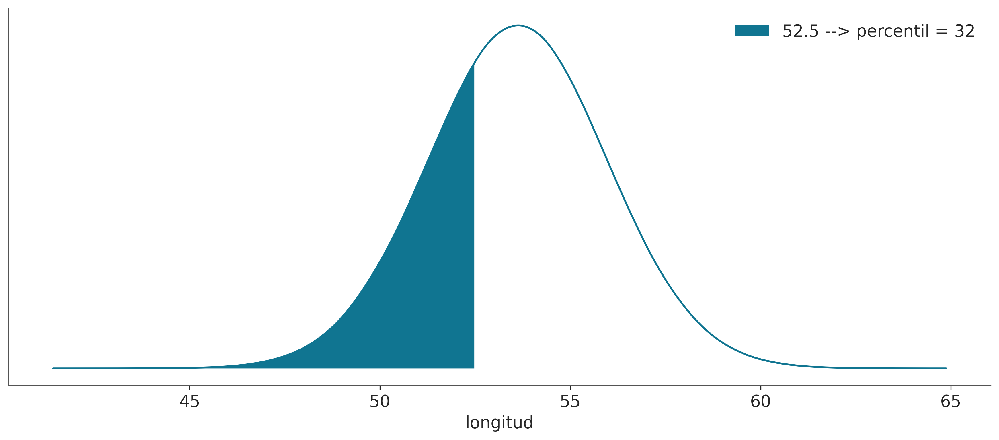

In [32]:
ref = 52.5
grid, pdf = az.stats.density_utils._kde_linear(y_ppc.values)
_, ax = plt.subplots()
ax.plot(grid, pdf)
percentile = int((y_ppc <= ref).mean() * 100)
ax.fill_between(grid[grid < ref], pdf[grid < ref], label=f'{ref} --> percentil = {percentile:2d}')
ax.set_xlabel('longitud')
ax.set_yticks([])
plt.legend();

## Regresión por cuantiles

<br>

* En la regresión por cuantiles no nos interesa averiguar el comportamiento medio (o la varianza) el foco está en estimar una relación para un cuantíl dado.

* Motivaciones:
    * Regresión robusta. Así como la mediana es un estimador de la media, robusto a valores extremos, una *regresión mediana* será también robusta. 
    * Nos interesan cuantiles en particular. Esto sucede por ejemplo cuando nos interesa modelador valores en los extremos de una distribución. 

* Una disciplina donde las regresiones por cuantiles son frecuentes es la ecología. Esto se debe posiblemente, a que la existencia de complejas interacciones entre variables, donde el efecto de una variable sobre otra es distinto para distintos rangos de la variable.


## Regresión por cuantiles

<br>

* Para hacer regresiones por cuantiles utilizamos la distribución asimétrica de Laplace como likelihood. 

* Esta distribución la podemos pensar como dos distribuciones exponenciales espalda-con-espalda. 

* La distribución tiene 3 parámetros $\mu$ controla la localización, $\sigma$ la escala y $q$ la asimetría. 

* $q$ varía entre [0, 1], cuando $q=0.5$ la distribución asimétrica de Laplace sera simétrica (distribución de Laplace).

<br>

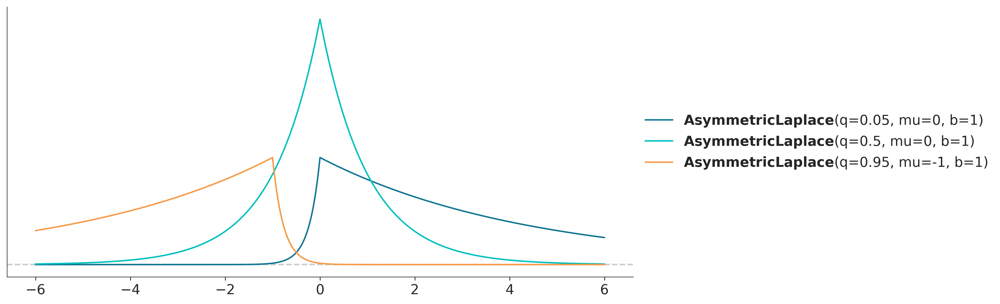

In [33]:
q = np.array([0.05, 0.5, 0.95])
for q_i, mu in zip(q, [0, 0, -1]):
    pz.AsymmetricLaplace(mu=mu, b=1, q=q_i).plot_pdf(support=(-6, 6))

In [34]:
y_con = np.stack([datos.Longitud.values]* 3).T
x_con = np.stack([datos.Meses.values]* 3).T

In [35]:
with pm.Model() as model_q:
    α = pm.Normal('α', 50, 3, shape=3)
    β = pm.Normal('β', 0, 5, shape=3)
    σ = pm.HalfNormal('σ', 5)

    μ = pm.Deterministic('μ', α + β * x_con**0.5)
    
    y_pred = pm.AsymmetricLaplace('y_pred',  mu=μ, b=σ, q=q, observed=y_con)
    
    idata_q = pm.sample(random_seed=123)

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [α, β, σ]


Output()

Sampling 4 chains for 1_000 tune and 1_000 draw iterations (4_000 + 4_000 draws total) took 8 seconds.


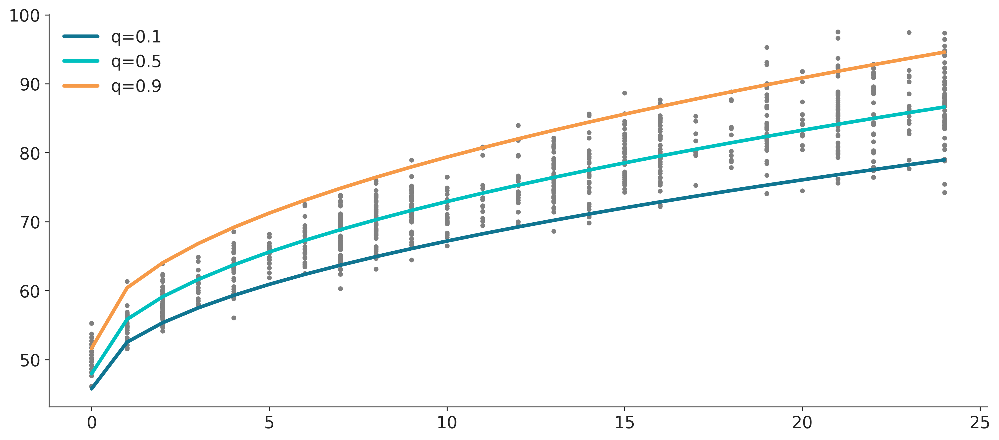

In [36]:
plt.plot(datos.Meses, datos.Longitud, ".", color="0.5")
for idx, label in enumerate(("q=0.1", "q=0.5", "q=0.9")):
    plt.plot(datos.Meses.values, idata_q.posterior["μ"].mean(("chain", "draw"))[:,idx],
            label=label, lw=3);
    
plt.legend();

In [37]:
with pm.Model() as model_n:
    α = pm.Normal('α', 50, 3)
    β = pm.Normal('β', 0, 5)
    σ = pm.HalfNormal('σ', 5)

    μ = pm.Deterministic('μ', α + β * datos.Meses.values**0.5)
    
    y_pred = pm.Normal('y_pred',  μ, σ, observed=datos.Longitud.values)
    
    idata_n = pm.sample(random_seed=123)

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [α, β, σ]


Output()

Sampling 4 chains for 1_000 tune and 1_000 draw iterations (4_000 + 4_000 draws total) took 3 seconds.


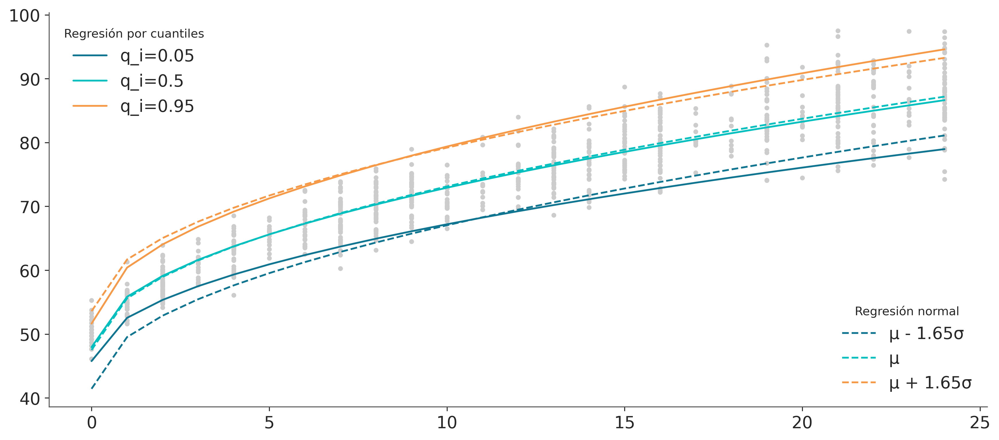

In [38]:
fig, ax = plt.subplots()

ax.plot(datos.Meses, datos.Longitud, ".", color="0.8")
lines = []
for idx, label in enumerate([f"{q_i=:}" for q_i in q]):
    line, = ax.plot(datos.Meses,
                   idata_q.posterior["μ"].mean(("chain", "draw"))[:,idx],
                   label=label)
    lines.append(line)
    
q_legend = ax.legend(handles=lines, loc='upper left', title="Regresión por cuantiles")

# aproximamos los cuantiles de la distribución posterior
q_95 = (idata_n.posterior["μ"] + idata_n.posterior["σ"]*1.65).mean(("chain", "draw"))
q_05 = (idata_n.posterior["μ"] - idata_n.posterior["σ"]*1.65).mean(("chain", "draw"))

line0, = ax.plot(datos.Meses, q_05, "C0", label="μ - 1.65σ", ls="--")
line1, = ax.plot(datos.Meses, idata_n.posterior["μ"].mean(("chain", "draw")), "C1", label="μ", ls="--")
line2, = ax.plot(datos.Meses, q_95, "C2", label="μ + 1.65σ", ls="--");

ax.add_artist(q_legend)

ax.legend(handles=[line0, line1, line2], loc='lower right', title="Regresión normal");

## Regresión lineal jerárquica

* Anteriormente vimos modelos jerárquicos. Como ya vimos, esto se hace incluyendo hiperpriors.

* Este mismo concepto se puede aplicar en regresión.

* Vamos a crear un dataset sintético. Ocho grupos de datos relacionados, incluido un grupo con un solo dato!

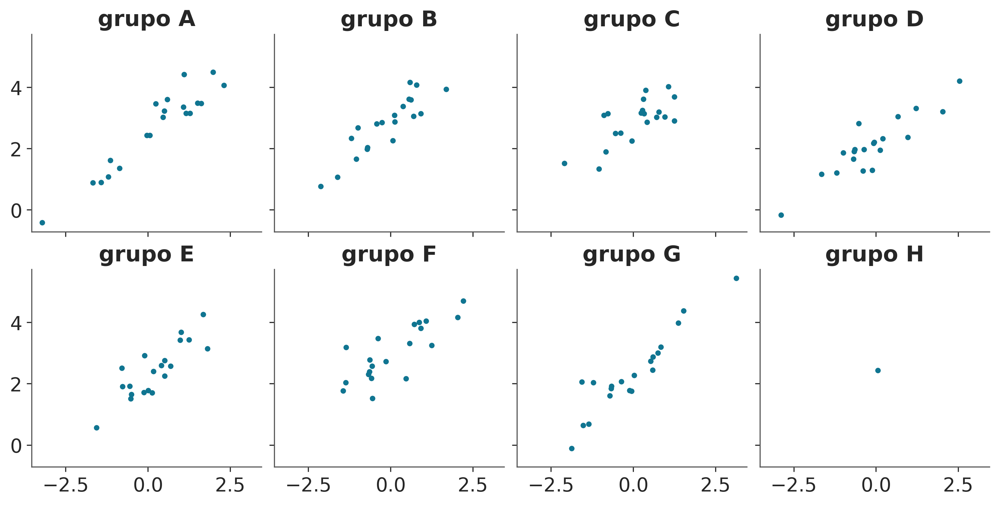

In [39]:
N = 20
grupos = ["A", "B", "C", "D", "E", "F", "G", "H"]
M = len(grupos)
idx = np.repeat(range(M - 1), N)
idx = np.append(idx, 7)
np.random.seed(314)
alpha_real = np.random.normal(2.5, 0.5, size=M)
beta_real = np.random.beta(6, 1, size=M)
eps_real = np.random.normal(0, 0.5, size=len(idx))
y_m = np.zeros(len(idx))
x_m = np.random.normal(0, 1, len(idx))
y_m = alpha_real[idx] + beta_real[idx] * x_m + eps_real
_, ax = plt.subplots(2, 4, figsize=(10, 5), sharex=True, sharey=True)
ax = np.ravel(ax)
j, k = 0, N
for i, g in enumerate(grupos):
    ax[i].scatter(x_m[j:k], y_m[j:k], marker=".")
    ax[i].set_title(f"grupo {g}")
    j += N
    k += N

In [40]:
coords = {"grupo": grupos}

with pm.Model(coords=coords) as modelo_jerárquico:
    # hyper-priors
    α_μ = pm.Normal("α_μ", mu=y_m.mean(), sigma=1)
    α_σ = pm.HalfNormal("α_σ", 5)
    β_μ = pm.Normal("β_μ", mu=0, sigma=1)
    β_σ = pm.HalfNormal("β_σ", sigma=5)

    # priors
    α = pm.Normal("α", mu=α_μ, sigma=α_σ, dims="grupo")
    β = pm.Normal("β", mu=β_μ, sigma=β_σ, dims="grupo")
    σ = pm.HalfNormal("σ", 5)
    _ = pm.Normal("y_pred", mu=α[idx] + β[idx] * x_m, sigma=σ, observed=y_m)

    idata_mj = pm.sample(random_seed=123)

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [α_μ, α_σ, β_μ, β_σ, α, β, σ]


Output()

Sampling 4 chains for 1_000 tune and 1_000 draw iterations (4_000 + 4_000 draws total) took 6 seconds.
There were 172 divergences after tuning. Increase `target_accept` or reparameterize.
The effective sample size per chain is smaller than 100 for some parameters.  A higher number is needed for reliable rhat and ess computation. See https://arxiv.org/abs/1903.08008 for details


## Reparametrización

<br>

* En vez definir $\beta \sim \mathcal{N}(\beta_\mu, \beta_\sigma)$ 

* Vamos a escribir $\beta = \beta_\mu + \beta_\text{offset} * \beta_\sigma$. 

* Donde $\beta_\text{offset}$ es una distribución normal con media 0 y desviación estándar 1. 

* Conceptualmente la diferencia es que en el primer caso estamos modelando la pendiente de cada grupo de forma explícita, mientras que en el segundo caso lo estamos haciendo como una desviación respecto de un valor común ($\beta_\mu$). 

* A la primer versión se la suele llamar centrada y a la segunda no-centrada.

<br>

In [41]:
with pm.Model(coords=coords) as jerárquico_no_centrado:
    # hyper-priors
    α_μ = pm.Normal("α_μ", mu=y_m.mean(), sigma=1)
    α_σ = pm.HalfNormal("α_σ", 5)
    β_μ = pm.Normal("β_μ", mu=0, sigma=1)
    β_σ = pm.HalfNormal("β_σ", sigma=5)

    # priors
    α = pm.Normal("α", mu=α_μ, sigma=α_σ, dims="grupo")

    β_offset = pm.Normal("β_offset", mu=0, sigma=1, dims="grupo")
    β = pm.Deterministic("β", β_μ + β_offset * β_σ, dims="grupo")

    σ = pm.HalfNormal("σ", 5)
    _ = pm.Normal("y_pred", mu=α[idx] + β[idx] * x_m, sigma=σ, observed=y_m)

    idata_ncen = pm.sample(target_accept=0.85, random_seed=123)

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [α_μ, α_σ, β_μ, β_σ, α, β_offset, σ]


Output()

Sampling 4 chains for 1_000 tune and 1_000 draw iterations (4_000 + 4_000 draws total) took 9 seconds.


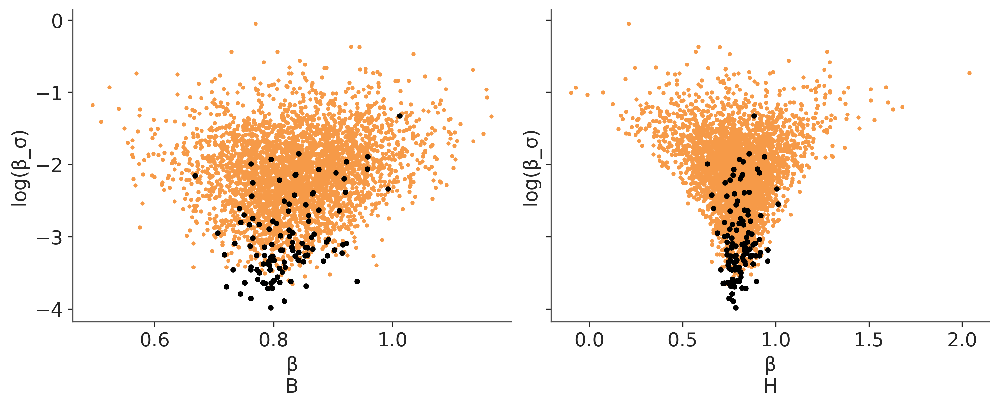

In [42]:
idata_mj.posterior["log(β_σ)"] = np.log(idata_mj.posterior["β_σ"])

_, axes = plt.subplots(1, 2, sharey="row", sharex="col", figsize=(10, 4))

nvars = ["log(β_σ)", "log(β_σ)"]
glabel = ["B", "H"]
for ax, var, gl in zip(axes.ravel(), nvars, glabel):
    az.plot_pair(
        idata_mj,
        var_names=["β", var],
        coords={"grupo": [gl]},
        divergences=True,
        scatter_kwargs={"color": "C2"},
        divergences_kwargs={"color": "k", "marker": ".", "mec": None},
        ax=ax,
    )

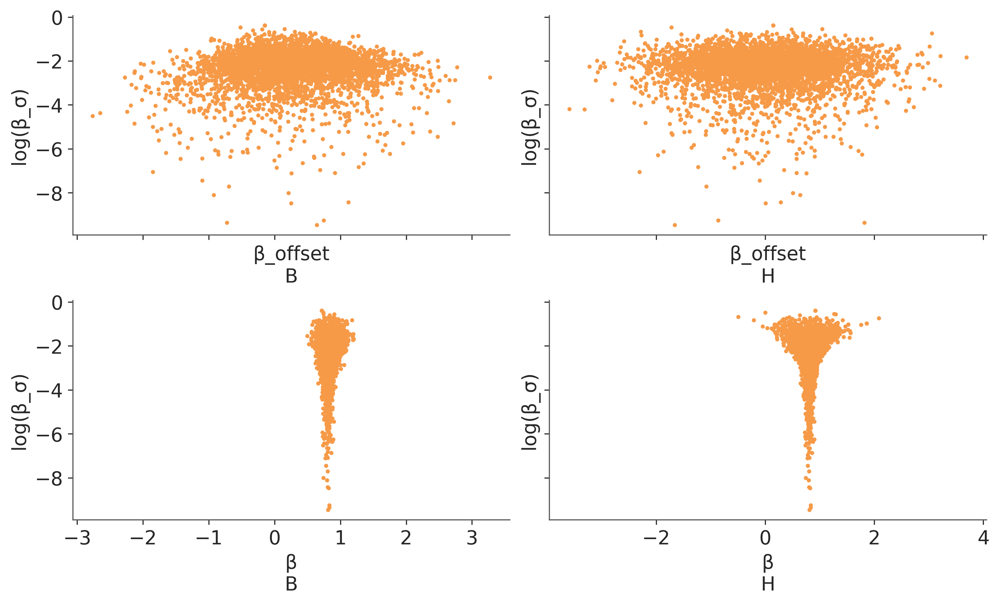

In [43]:
idata_ncen.posterior["log(β_σ)"] = np.log(idata_ncen.posterior["β_σ"])

_, axes = plt.subplots(2, 2, sharey="row", sharex="col", figsize=(10, 6))

nvars = np.repeat(["β_offset", "β"], 2)
glabel = ["B", "H"] * 2

for ax, var, gl in zip(axes.ravel(), nvars, glabel):
    az.plot_pair(
        idata_ncen,
        var_names=[var, "log(β_σ)"],
        coords={"grupo": [gl]},
        divergences=True,
        scatter_kwargs={"color": "C2"},
        divergences_kwargs={"color": "k", "marker": ".", "mec": None},
        ax=ax,
    )

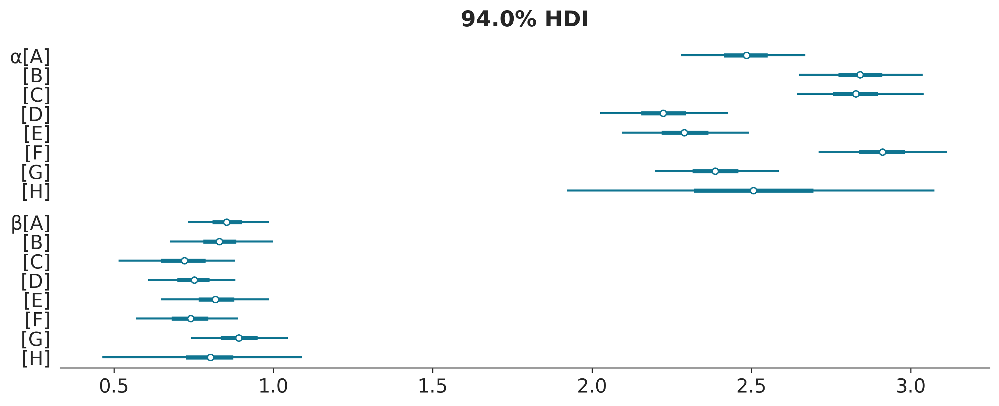

In [44]:
az.plot_forest(idata_ncen, var_names=['α', 'β'], figsize=(10, 4), combined=True);

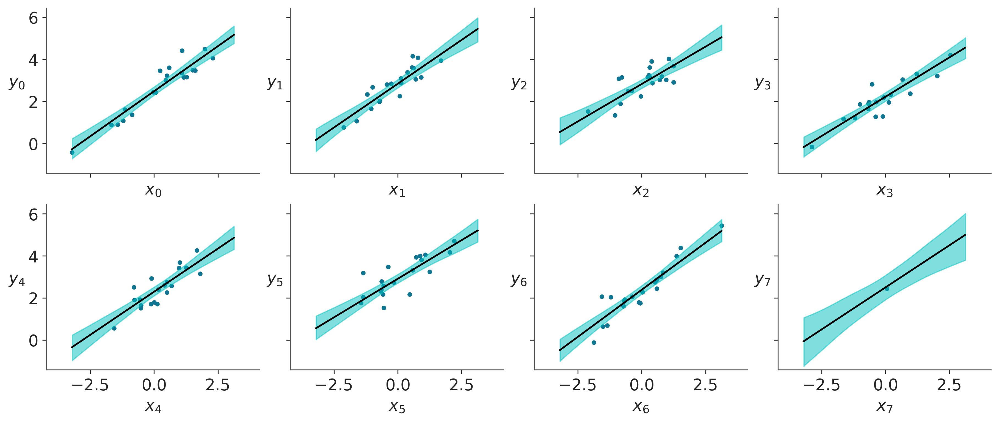

In [45]:
_, ax = plt.subplots(2, 4, figsize=(12, 5), sharex=True, sharey=True)
ax = np.ravel(ax)
j, k = 0, N
x_range = np.linspace(x_m.min(), x_m.max(), 10)
posterior = az.extract(idata_ncen)

for i, g in enumerate(grupos):
    ax[i].scatter(x_m[j:k], y_m[j:k], marker=".")
    ax[i].set_xlabel("$x_{}$".format(i))
    ax[i].set_ylabel("$y_{}$".format(i), labelpad=10, rotation=0)
    alfas = posterior["α"].sel(grupo=g)
    betas = posterior["β"].sel(grupo=g)
    alfa_m = alfas.mean("sample").item()
    beta_m = betas.mean("sample").item()
    ax[i].plot(x_range, alfa_m + beta_m * x_range, c="k")
    az.plot_hdi(x_range, alfas + betas * xr.DataArray(x_range).transpose(), ax=ax[i])
    plt.xlim(x_m.min() - 1, x_m.max() + 1)
    plt.ylim(y_m.min() - 1, y_m.max() + 1)
    j += N
    k += N

## Regresión lineal múltiple

<br>

* Hasta ahora, hemos estado trabajando con una variable dependiente y una variable independiente. 

* Sin embargo, no es inusual tener varias variables independientes que queremos incluir en nuestro modelo. Algunos ejemplos podrían ser:

* Calidad percibida del vino (dependiente) y acidez, densidad, grado alcohólico, azúcar residual y contenido de sulfatos (variables independientes)
* Calificaciones promedio de un estudiante (dependiente) e ingreso familiar, distancia del hogar a la escuela y nivel de educación de la madre (variable independientes)

<br>

## Regresión lineal múltiple

En un modelo de regresión lineal múltiple, modelamos la media de la variable dependiente de la siguiente manera:

$$
\mu = \alpha + \beta_1 X_{1} + \beta_2 X_{2} + \dots + \beta_k X_{k}
$$

Usando notación de álgebra lineal:

$$
\mu = \alpha + \mathbf{X} \beta
$$

donde $\mathbf{X}$ es una matriz de tamaño $n \times k$ con los valores de las variables independientes y $\beta$ es un vector de tamaño $k$ con los coeficientes de las variables independientes, y $n$ es el número de observaciones.

In [46]:
with pm.Model() as model_mlb:
    α = pm.Normal("α", mu=0, sigma=1)
    β0 = pm.Normal("β0", mu=0, sigma=10)
    β1 = pm.Normal("β1", mu=0, sigma=10)
    σ = pm.HalfNormal("σ", 10)
    μ = pm.Deterministic("μ", pm.math.exp(α + β0 * bicis.temperatura + β1 * bicis.hora))
    _ = pm.NegativeBinomial("y_pred", mu=μ, alpha=σ, observed=bicis.alquiladas)

    idata_mlb = pm.sample(random_seed=123)

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [α, β0, β1, σ]


Output()

Sampling 4 chains for 1_000 tune and 1_000 draw iterations (4_000 + 4_000 draws total) took 7 seconds.


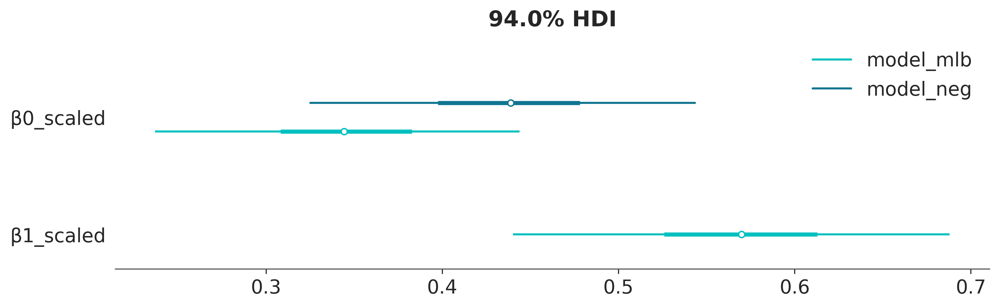

In [47]:
# Para hacer comparables los coeficientes los escalamos respecto de su correspondiente desviación estándar
idata_neg.posterior["β0_scaled"] = idata_neg.posterior["β"] * bicis.temperatura.std()

idata_mlb.posterior["β0_scaled"] = idata_mlb.posterior["β0"] * bicis.temperatura.std()
idata_mlb.posterior["β1_scaled"] = idata_mlb.posterior["β1"] * bicis.hora.std()

az.plot_forest([idata_neg, idata_mlb], model_names=["model_neg", "model_mlb"], var_names=["β0_scaled", "β1_scaled"], figsize=(10, 3), combined=True);

## Bambi: una sintaxis para gobernarlos a todos

PyMC permite construir modelos arbitrarios
* :-) Flexibilidad
* :-( Trabajo

* Bambi se focaliza en GLMs y algunas extensiones como modelos jerárquicos, splines (GAMs), GPs
* Los modelos se especifican usando la fórmula de Wilkinson (con algunas modificaciones)

In [48]:
SIZE = 117
datos = pd.DataFrame(
    {
        "y": np.random.normal(size=SIZE),
        "x": np.random.normal(size=SIZE),
        "z": np.random.normal(size=SIZE),
        "g": ["Group A", "Group B", "Group C"] * 39,
    }
)
datos.head()

,y,x,z,g
0,0.407373,0.926419,0.363536,Group A
1,-0.077750,-2.315925,-1.165464,Group B
2,0.459236,1.177808,0.422089,Group C
3,1.117329,1.772152,0.682265,Group A
4,-0.788372,1.089291,0.375650,Group B


Usando estos datos queremos construir un modelo lineal que prediga `y` a partir de `x`. Usando PyMC haríamos algo como:


```python
with pm.Model() as lm:
    Intercept = pm.Normal("Intercept", 0, 1)
    x = pm.Normal("x", 0, 1)
    y_sigma = pm.HalfNormal("sigma", 1)
    y_mean = Intercept + x * datos["x"]
    y = pm.Normal("y", y_mean, y_sigma, observed=datos["y"])
```

Usando la sintaxis de Bambi, podemos escribir el mismo modelo como:

In [49]:
un_modelo = bmb.Model("y ~ x", datos)

In [50]:
un_modelo

       Formula: y ~ x
        Family: gaussian
          Link: mu = identity
  Observations: 117
        Priors: 
    target = mu
        Common-level effects
            Intercept ~ Normal(mu: 0.0108, sigma: 2.6365)
            x ~ Normal(mu: 0.0, sigma: 2.4114)
        
        Auxiliary parameters
            sigma ~ HalfStudentT(nu: 4.0, sigma: 1.0541)

In [51]:
# Omitimos el intercepto
no_intercepto_1 = bmb.Model("y ~ 0 + x", datos)
no_intercepto_1

       Formula: y ~ 0 + x
        Family: gaussian
          Link: mu = identity
  Observations: 117
        Priors: 
    target = mu
        Common-level effects
            x ~ Normal(mu: 0.0, sigma: 2.4114)
        
        Auxiliary parameters
            sigma ~ HalfStudentT(nu: 4.0, sigma: 1.0541)

In [52]:
# Omitimos el intercepto
no_intercepto_2 = bmb.Model("y ~ -1 + x", datos)
no_intercepto_2

       Formula: y ~ -1 + x
        Family: gaussian
          Link: mu = identity
  Observations: 117
        Priors: 
    target = mu
        Common-level effects
            x ~ Normal(mu: 0.0, sigma: 2.4114)
        
        Auxiliary parameters
            sigma ~ HalfStudentT(nu: 4.0, sigma: 1.0541)

In [53]:
modelo_h = bmb.Model("y ~ x + z + (x | g)", datos)
modelo_h

       Formula: y ~ x + z + (x | g)
        Family: gaussian
          Link: mu = identity
  Observations: 117
        Priors: 
    target = mu
        Common-level effects
            Intercept ~ Normal(mu: 0.0108, sigma: 2.6426)
            x ~ Normal(mu: 0.0, sigma: 2.4114)
            z ~ Normal(mu: 0.0, sigma: 3.0492)
        
        Group-level effects
            1|g ~ Normal(mu: 0.0, sigma: HalfNormal(sigma: 2.6426))
            x|g ~ Normal(mu: 0.0, sigma: HalfNormal(sigma: 2.4114))
        
        Auxiliary parameters
            sigma ~ HalfStudentT(nu: 4.0, sigma: 1.0541)

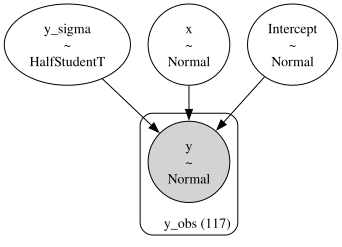

In [54]:
un_modelo.build()
un_modelo.graph()

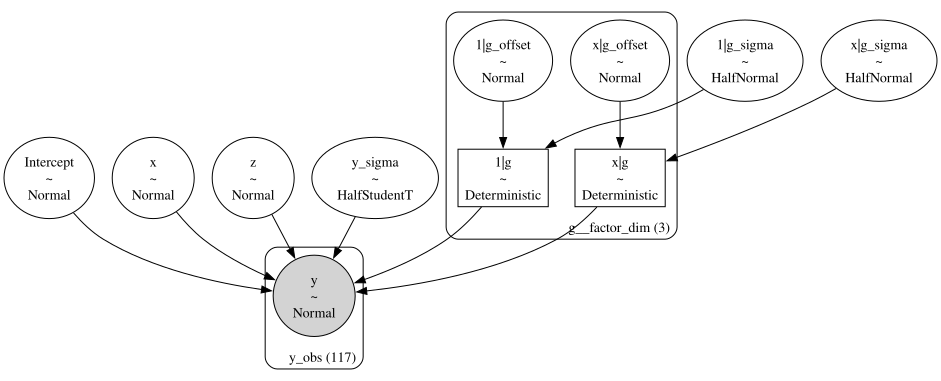

In [55]:
modelo_h.build()
modelo_h.graph()

## Bicicletas bambinas

In [56]:
bicis = pd.read_csv("../datos/bicis.csv")

In [57]:
modelo_t = bmb.Model("alquiladas ~ temperatura", bicis, family="negativebinomial")
idata_t = modelo_t.fit()

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [alquiladas_alpha, Intercept, temperatura]


Output()

Sampling 4 chains for 1_000 tune and 1_000 draw iterations (4_000 + 4_000 draws total) took 3 seconds.


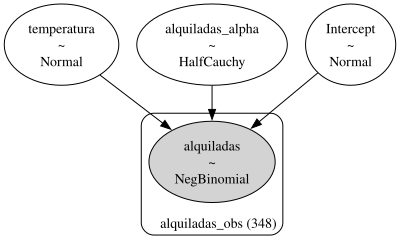

In [58]:
modelo_t.graph()

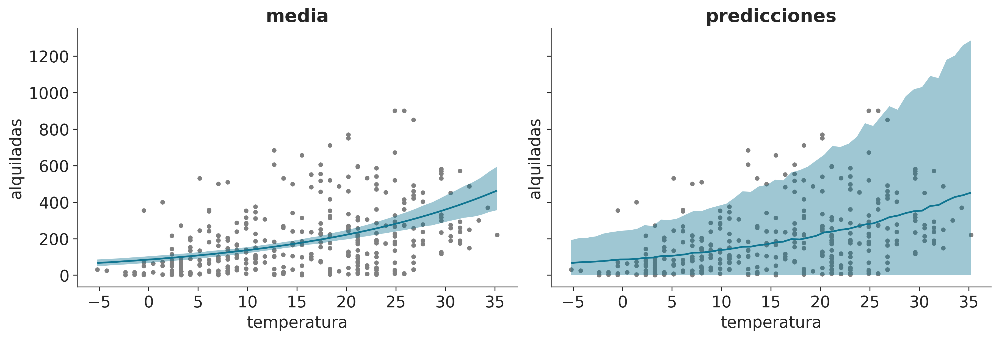

In [59]:
_, axes = plt.subplots(1, 2, sharey=True, figsize=(12, 4)) 
bmb.interpret.plot_predictions(modelo_t, idata_t, "temperatura", ax=axes[0])
bmb.interpret.plot_predictions(modelo_t, idata_t, "temperatura", pps=True, ax=axes[1])

axes[0].plot(bicis.temperatura, bicis.alquiladas, ".", color="0.5",  zorder=-3)
axes[1].plot(bicis.temperatura, bicis.alquiladas, ".", color="0.5", zorder=-3)
axes[0].set_title("media")
axes[1].set_title("predicciones");

In [60]:
modelo_th = bmb.Model("alquiladas ~ temperatura + humedad", bicis, 
                     family="negativebinomial")
                     
idata_th = modelo_th.fit()

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [alquiladas_alpha, Intercept, temperatura, humedad]


Output()

Sampling 4 chains for 1_000 tune and 1_000 draw iterations (4_000 + 4_000 draws total) took 3 seconds.


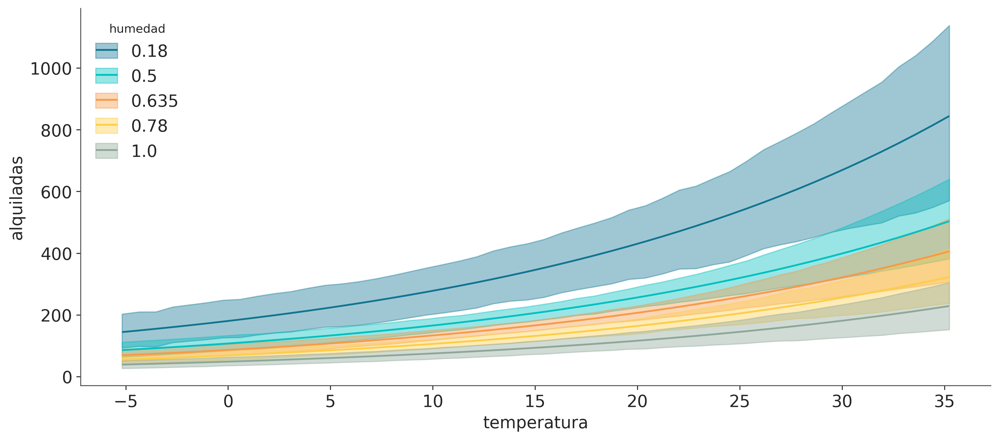

In [61]:
bmb.interpret.plot_predictions(modelo_th, idata_th, ["temperatura", "humedad"],
                               subplot_kwargs={"group":"humedad"},
                               fig_kwargs={"sharey":True, "sharex":True});

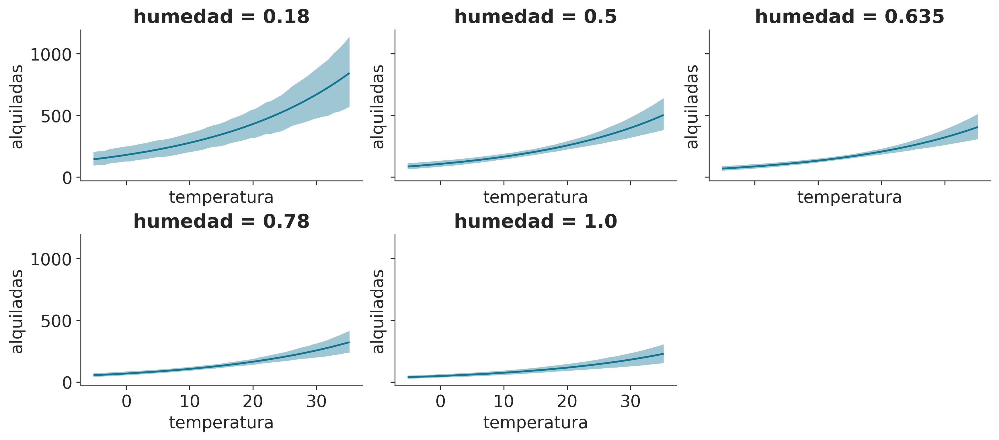

In [62]:
bmb.interpret.plot_predictions(modelo_th, idata_th, ["temperatura", "humedad"],
                               subplot_kwargs={"group":None, "panel":"humedad"},
                               legend=False,
                               fig_kwargs={"sharey":True, "sharex":True});

## Modelos Additivos Generalizados

<br>

* Son primos de los GLMs, una generalización.

* Permite ajustar funciones no lineales, pero sigue siendo una regresión lineal; ya que la linealidad se refiere a los coeficientes (los $\beta$s), no a las variables (las $X$s).

* La idea central es que una forma de lograr modelos flexibles es inventarse nuevas variables a partir de las observadas.

<br>

## Modelos Additivos Generalizados

La forma general de un GAM, para un problema de regresión con una sola covariable $X$ es:

<br>

$$
\mu = \beta_0 + \beta_1 B_{1}(X) + \beta_2 B_{2}(X) + \cdots + \beta_m B_{m}(X)
$$

Donde $B_{m}$ es alguna función arbitraria, algunos casos comunes en la práctica son polinomios, splines, función base de Fourier.
<br>

## Regresión polinomial

<br>


Una forma de ajustar curvas usando un modelo de regresión lineal es construyendo un polinomio, como este:

$$
   \mu = \beta_0 + \beta_1 X + \beta_2 X^2 + \beta_3 X^3 + \beta_4 X^4 \dots \beta_m X^m
$$

donde $m$ es el grado del polinomio

<br>

## Regresión polinomial, inconvenientes

<br>

* Los polinomios actúan globalmente, es decir se aplican a todo el conjunto de datos, lo que puede ser problemático ya que ciertas regiones pueden necesitar distinta flexibilidad.

* Los polinomios de grado alto pueden crear curvas demasiado flexibles, que tieneden a sogreajustar y no generalizar bien.

* Los priors y la marginalizar sobre el prior, contribuyen a mitigar estos defectos.

<br>

## Regresión polinomial en Bambi

<br>

* Hay dos formas de definir una regresión polinómial con Bambi. Podemos escribir los polinomios *brutos*:

```python
"y ~ x + I(x ** 2) + I(x ** 3) + I(x ** 4)"
```

* Donde usamos la función de identidad `I` para dejar claro que queremos elevar $x$ a alguna potencia.
* Necesitamos esto porque el operador `**` tiene un significado especial para Bambi. 

<br>

## Regresión polinomial

<br>

Alternativamente podemos escribir

```python
"y ~ poly(x, 4)"
```

* Esto también generará un polinomio de grado 4
* Pero los términos del polinomio serán ortogonales entre sí

<br>

In [63]:
modelo_poly4 = bmb.Model("alquiladas ~ poly(hora, degree=4)", bicis,
                       family="negativebinomial")

idata_poly4 = modelo_poly4.fit()

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [alquiladas_alpha, Intercept, poly(hora, degree=4)]


Output()

Sampling 4 chains for 1_000 tune and 1_000 draw iterations (4_000 + 4_000 draws total) took 4 seconds.


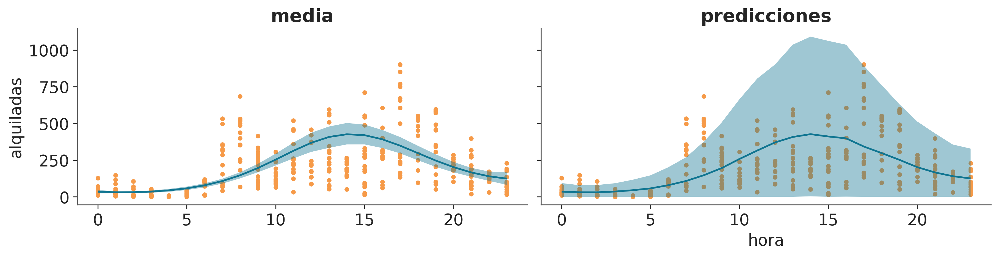

In [64]:
_, axes = plt.subplots(1, 2, sharey=True, sharex="col", figsize=(12, 3)) 
bmb.interpret.plot_predictions(modelo_poly4, idata_poly4, "hora", ax=axes[0])
bmb.interpret.plot_predictions(modelo_poly4, idata_poly4, "hora", pps=True, ax=axes[1])

for ax in axes.ravel():
    ax.plot(bicis.hora, bicis.alquiladas, "C2.", zorder=-3)
axes[0].set_title("media")
axes[1].set_title("predicciones")
axes[0].set_xlabel("")
axes[1].set_ylabel("");

## Splines

Una forma general de escribir modelos muy flexibles es aplicar funciones $B_{m}$ a $X_{m}$ y luego multiplicarlas por coeficientes $\beta_m$:

$$
\mu = \beta_0 + \beta_1 B_{1}(X_{1}) + \beta_2 B_{2}(X_{2}) + \cdots + \beta_m B_{m}(X_{m})
$$

* Somos libres de elegir las funciones $B_{m}$, por ejemplo, podemos elegir polinomios. 

* Una opción popular es usar B-splines
* Los B-splines son polinomios por partes, es decir, polinomios que están restringidos a afectar solo una parte de los datos. 




![](../img/piecewise.png)


![](../img/splines_weighted.png)

In [65]:
num_knots = 6
knots = np.linspace(0, 23, num_knots+2)[1:-1]
modelo_spline = bmb.Model("alquiladas ~ bs(hora, degree=3, knots=knots)", bicis,           
                         family="negativebinomial")

idata_spline = modelo_spline.fit()

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [alquiladas_alpha, Intercept, bs(hora, degree=3, knots=knots)]


Output()

Sampling 4 chains for 1_000 tune and 1_000 draw iterations (4_000 + 4_000 draws total) took 7 seconds.


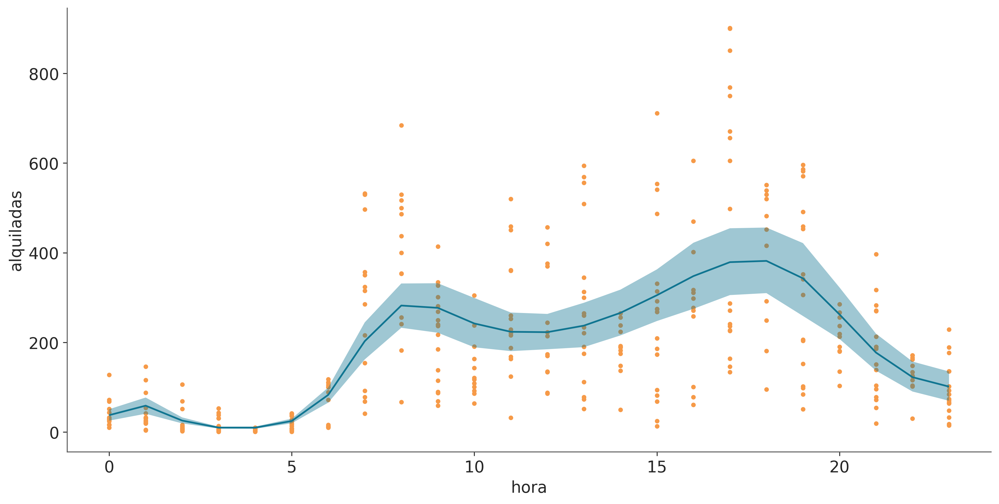

In [66]:
_, ax = plt.subplots(sharey=True, sharex="col", figsize=(12, 6)) 
bmb.interpret.plot_predictions(modelo_spline, idata_spline, "hora", ax=ax)
ax.plot(bicis.hora, bicis.alquiladas, "C2.", zorder=-3);

## Modelos distribucionales con Bambi

In [68]:
bebes = pd.read_csv('../datos/babies.csv')

In [69]:
modelo_cons = bmb.Model("Longitud ~ np.sqrt(Meses)", bebes)
idata_cons = modelo_cons.fit()

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [Longitud_sigma, Intercept, np.sqrt(Meses)]


Output()

Sampling 4 chains for 1_000 tune and 1_000 draw iterations (4_000 + 4_000 draws total) took 2 seconds.


In [70]:
formula = bmb.Formula(
    "Longitud ~ np.sqrt(Meses)",
    "sigma ~ Meses"
)
modelo_dis = bmb.Model(formula, bebes)
idata_dis = modelo_dis.fit()

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [Intercept, np.sqrt(Meses), sigma_Intercept, sigma_Meses]


Output()

Sampling 4 chains for 1_000 tune and 1_000 draw iterations (4_000 + 4_000 draws total) took 3 seconds.


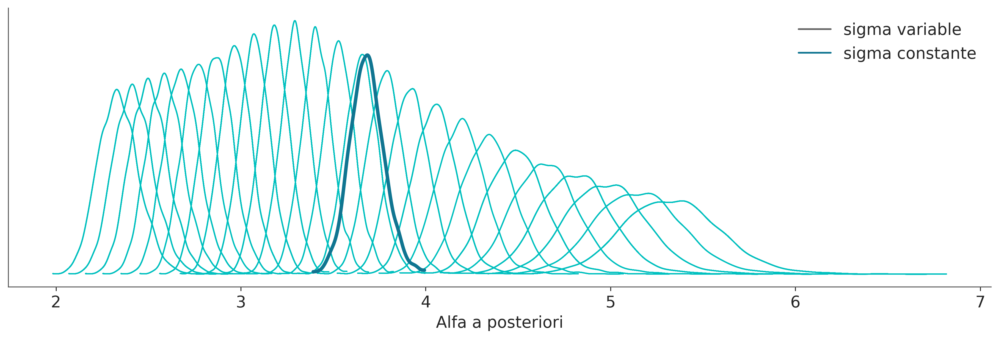

In [71]:
#| code-fold: true

fig, ax = plt.subplots(figsize=(12, 4))
from matplotlib.lines import Line2D

for idx in idata_dis.posterior.coords.get("Longitud_obs"):
    values = idata_dis.posterior["sigma"].sel(Longitud_obs=idx).to_numpy().flatten()
    grid, pdf = az.kde(values)
    ax.plot(grid, pdf, lw=1, color="C1")

values = idata_cons.posterior["Longitud_sigma"].to_numpy().flatten()
grid, pdf = az.kde(values)
ax.plot(grid, pdf, lw=3, color="C0")

handles = [
    Line2D([0], [0], label="sigma variable", lw=1.5, color="k", alpha=0.6),
    Line2D([0], [0], label="sigma constante", lw=1.5, color="C0")
]

legend = ax.legend(handles=handles, loc="upper right")

ax.set(xlabel="Alfa a posteriori", yticks=[]);

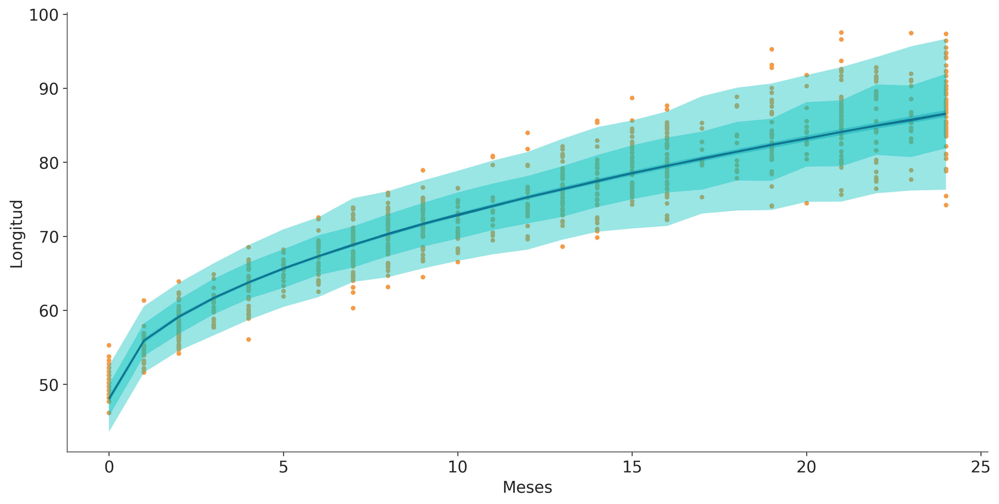

In [72]:
_, ax = plt.subplots(sharey=True, sharex="col", figsize=(12, 6)) 
bmb.interpret.plot_predictions(modelo_dis, idata_dis, "Meses", ax=ax, fig_kwargs={"color":"k"})
bmb.interpret.plot_predictions(modelo_dis, idata_dis, "Meses", pps=True, ax=ax)
ax_ = bmb.interpret.plot_predictions(modelo_dis, idata_dis, "Meses", pps=True, ax=ax, prob=0.65)
ax_[1][0].get_children()[5].set_facecolor('C1')  

ax.plot(bebes.Meses, bebes.Longitud, "C2.", zorder=-3);

## Predicciones para valores no-observados

<br>

* En PyMC el muestreo de la distribución predictiva a posteriori, evaluada en valores no observados de dos pasos extras `pm.Mutable_data(.)` --> `pm.set_data(.)`

* En Bambi esto no es necesario

<br>
<br>

In [73]:
modelo_dis.predict(idata_dis, kind="pps", data=pd.DataFrame({"Meses":[0.5]}))

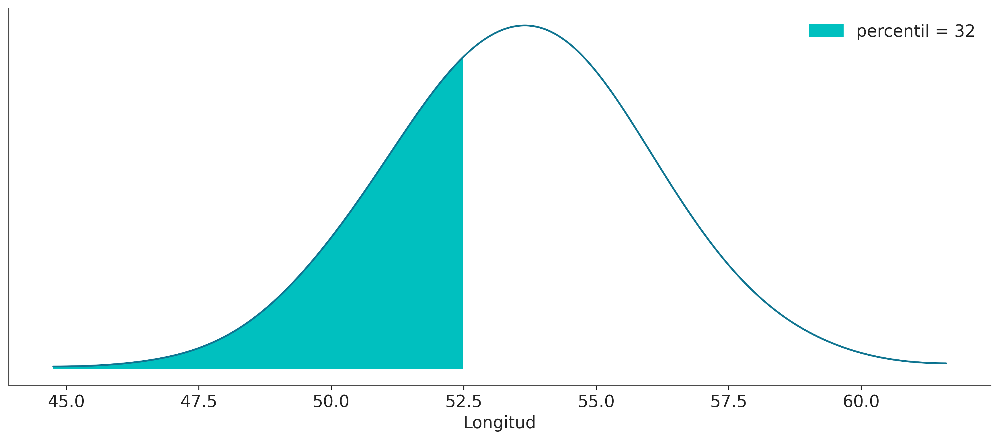

In [74]:
#| code-fold: true

ref = 52.5
y_ppc = idata_dis.posterior_predictive["Longitud"].stack(sample=("chain", "draw"))
grid, pdf = az.stats.density_utils._kde_linear(y_ppc.values)
plt.plot(grid, pdf)
percentile = int((y_ppc <= ref).mean() * 100)
plt.fill_between(
    grid[grid < ref],
    pdf[grid < ref],
    label="percentil = {:2d}".format(percentile),
    color="C1",
)
plt.xlabel("Longitud")
plt.yticks([])
plt.legend();

## Selección de Variables

<br>

* La selección de variables se refiere al proceso de identificar las variables más relevantes en un modelo a partir de un conjunto más amplio de predictores. 

* Realizamos la selección de variables bajo el supuesto de que sólo un subconjunto de variables tiene un impacto considerable en el resultado de interés, mientras que otras aportan poco o ningún valor adicional.


<br>
<br>

### Más Bayesianos que Bayes

<br>

* La versión "más Bayesiana" es incluir variables que podamos, ya que de esa forma incluimos la incerteza sobre la importancia de todas las variables.

* En la práctica no siempre es la mejor idea. 
    * Necesitamos reducir el costo de medición. 
    * Queremos reducir el costo computacional. 
    * Buscamos una mejor comprensión del problema. 
    * Deseamos un modelo más robusto a los cambios en la distribución generadora de datos


<br>
<br>

## Inferencia predictiva por proyección

<br>
<br>

* Existen muchos métodos para realizar selección de variables. 

* Vamos a discutir inferencia predictiva por proyección (https://arxiv.org/abs/2306.15581)

<br>
<br>

## Inferencia predictiva por proyección

<br>

Los principales pasos de la inferencia predictiva por proyección son:

* Generar un modelo de referencia, es decir, un modelo con todas las variables que creas que pueden ser relevantes y/o pudiste medir.
* Generar un conjunto de submodelos, es decir, modelos que solo incluyen algún subconjunto de las variables presentes en el modelo de referencia.
* "Proyectar" la distribución a posteriori --> Obtener los parámetros para los submodelos que inducen una distribución predictiva a posteriori lo más cercana posible a las predicciones del modelo de referencia
* Eligir el modelo más pequeño que haga predicciones lo suficientemente cercanas al modelo de referencia

## Selección de variables con Kulprit

<br>

* Kulprit es un paquete de Python para inferencia predictiva por proyecciones. Funciona con Bambi, ya que podemos pasar un modelo de referencia creado con él y Kulprit hará todo el trabajo pesado por nosotros. 

* Para ilustrar cómo usar Kulprit, usaremos el conjunto de datos de grasa corporal. Este conjunto de datos tiene medidas de 251 individuos, incluida su edad, peso, altura, circunferencia del abdomen, etc. Nuestro propósito es predecir el porcentaje de grasa corporal (según lo estimado por la variable `siri`). 

<br>

In [76]:
body = pd.read_csv("../datos/body_fat.csv")

In [77]:
model = bmb.Model("siri ~ age + weight + height + abdomen + thigh + wrist",
                  data=body)
idata = model.fit(idata_kwargs={'log_likelihood': True})

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [siri_sigma, Intercept, age, weight, height, abdomen, thigh, wrist]


Output()

Sampling 4 chains for 1_000 tune and 1_000 draw iterations (4_000 + 4_000 draws total) took 11 seconds.


In [78]:
ppi = kpt.ProjectionPredictive(model, idata)
ppi.search()

/home/osvaldo/anaconda3/envs/EI2/lib/python3.11/site-packages/arviz/stats/stats.py:792: UserWarning: Estimated shape parameter of Pareto distribution is greater than 0.62 for one or more samples. You should consider using a more robust model, this is because importance sampling is less likely to work well if the marginal posterior and LOO posterior are very different. This is more likely to happen with a non-robust model and highly influential observations.
  warnings.warn(


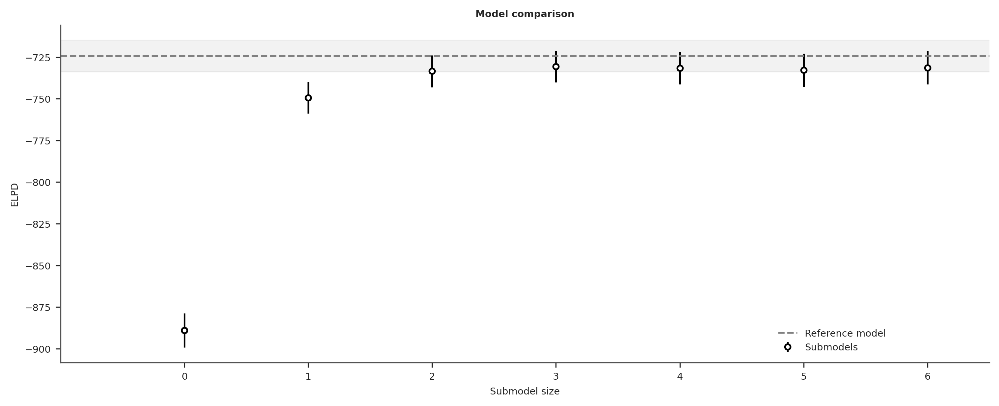

In [79]:
ppi.plot_compare(plot=True, figsize=(10, 4));

In [80]:
ppi

  0 siri ~ 1
  1 siri ~ abdomen
  2 siri ~ abdomen + weight
  3 siri ~ abdomen + weight + wrist
  4 siri ~ abdomen + weight + wrist + height
  5 siri ~ abdomen + weight + wrist + height + age
  6 siri ~ abdomen + weight + wrist + height + age + thigh

In [81]:
submodelo = ppi.project(3)

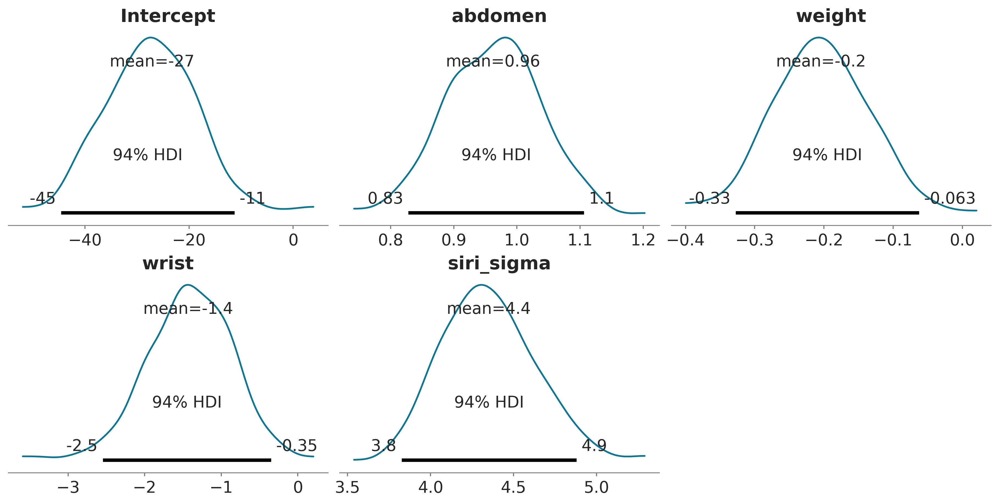

In [82]:
az.plot_posterior(submodelo.idata, figsize=(12, 6));

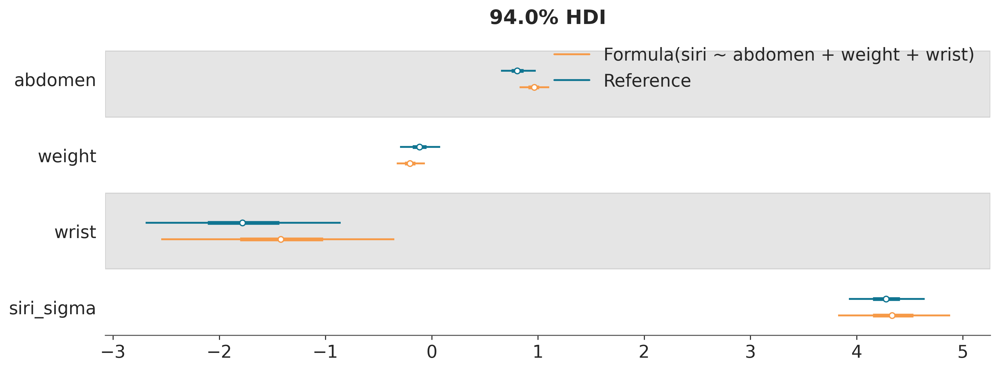

In [83]:
ppi.plot_densities(var_names=["~Intercept", "~age", "~height", "~thigh"],
                   submodels=[3],
                   kind="forest",
                   figsize=(11, 4),
                   plot_kwargs={"colors":["C0", "C2"]});

## Predictores Categóricos

<br>

Una variable categórica representa distintos grupos o categorías. La variable solo puede tomar un conjunto limitado de valores de esas categorías. Estos valores suelen ser etiquetas o nombres que no poseen significado numérico por sí solos. Algunos ejemplos son:

* Afiliación política: conservadora, liberal o progresista.
* Sexo: femenino o masculino.
* Nivel de satisfacción del cliente: muy insatisfecho, insatisfecho, neutral, satisfecho o muy satisfecho.

<br>

### Pingüinos Categóricos

* Vamos a utilizar el conjunto de datos de [Palmer Penguins](https://journals.plos.org/plosone/article?id=10.1371/journal.pone.0090081), que contiene 344 observaciones de 8 variables. 

* Por el momento nos interesa modelar la masa de los pingüinos en función de la longitud de su pico. 

* Se espera que la masa de los pingüinos aumente a medida que aumenta la longitud del pico. 

* La novedad de este ejemplo es que vamos a considerar la variable categórica, `species`. Esta variable tiene 3 categorías o niveles, a saber, `Adelie`, `Chinstrap` y `Gentoo`. 

In [7]:
penguins = pd.read_csv("../datos/penguins.csv").dropna()
penguins.head()

,species,island,bill_length,bill_depth,flipper_length,body_mass,sex,year
0,Adelie,Torgersen,3.91,1.87,18.1,3.75,male,2007
1,Adelie,Torgersen,3.95,1.74,18.6,3.80,female,2007
2,Adelie,Torgersen,4.03,1.80,19.5,3.25,female,2007
4,Adelie,Torgersen,3.67,1.93,19.3,3.45,female,2007
5,Adelie,Torgersen,3.93,2.06,19.0,3.65,male,2007


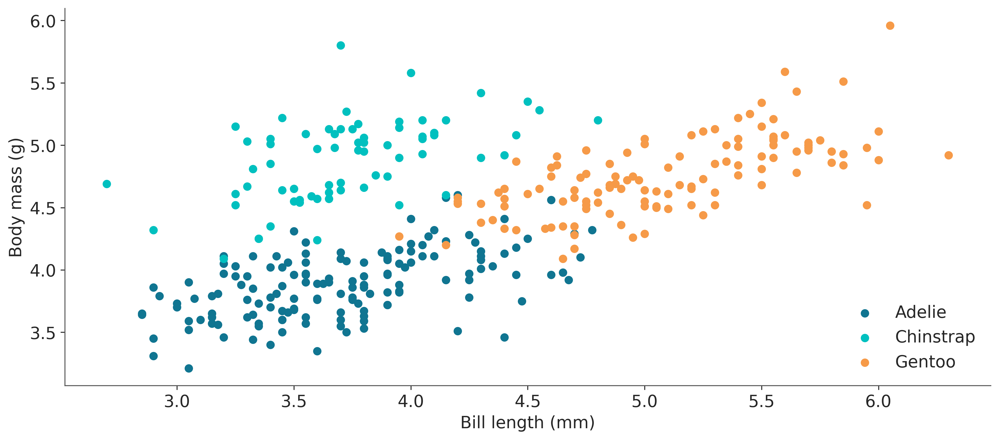

In [8]:
# Get unique categories
unique_categories = np.unique(penguins.species)

# Create color map for categories
category_color_map = {cat: f"C{i}" for i, cat in enumerate(unique_categories)}

# Generate colors for each category
colors = [category_color_map[cat] for cat in penguins.species]

# Create scatter plot for each category
for cat in unique_categories:
    category_data = penguins[penguins.species == cat]
    plt.scatter(category_data.body_mass, category_data.bill_length, c=category_color_map[cat], label=cat)

# Add labels and legend
plt.ylabel("Body mass (g)")
plt.xlabel("Bill length (mm)")
plt.legend(labels=unique_categories, loc="lower right");

In [14]:
modelo_p = bmb.Model("body_mass ~ bill_length + species", data=penguins)
idata_p = modelo_p.fit(random_seed=214)

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [body_mass_sigma, Intercept, bill_length, species]


Output()

Sampling 4 chains for 1_000 tune and 1_000 draw iterations (4_000 + 4_000 draws total) took 2 seconds.


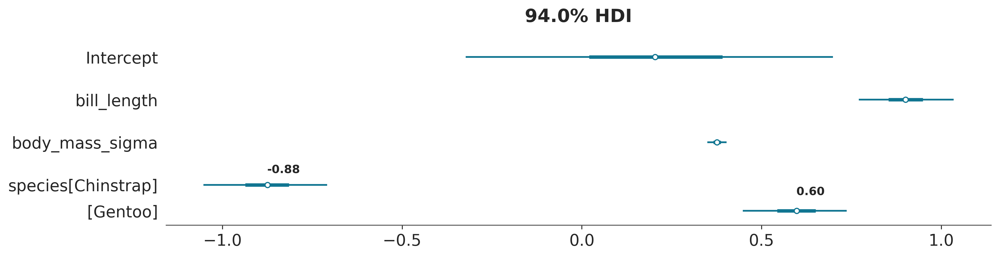

In [16]:
ax = az.plot_forest(idata_p, combined=True, figsize=(12, 3))
mean_chinstrap = idata_p.posterior["species"].sel(species_dim="Chinstrap").mean()
mean_gentoo = idata_p.posterior["species"].sel(species_dim="Gentoo").mean()
ax[0].annotate(f"{mean_chinstrap.item():.2f}", (mean_chinstrap , 1.2), weight='bold')
ax[0].annotate(f"{mean_gentoo.item():.2f}", (mean_gentoo , 0.5), weight='bold');

<br>

* De forma predeterminada, Bambi codifica variables categóricas con `N` niveles (3 especies) como `N-1` variables (2 especies). 

* Así, los coeficientes `species-Chinstrap` y `species-Gentoo` representan deflecciones del modelo base:


$$
\text{body_mass} = \beta_0 + \beta_1 \text{bill_length}
$$

<br>

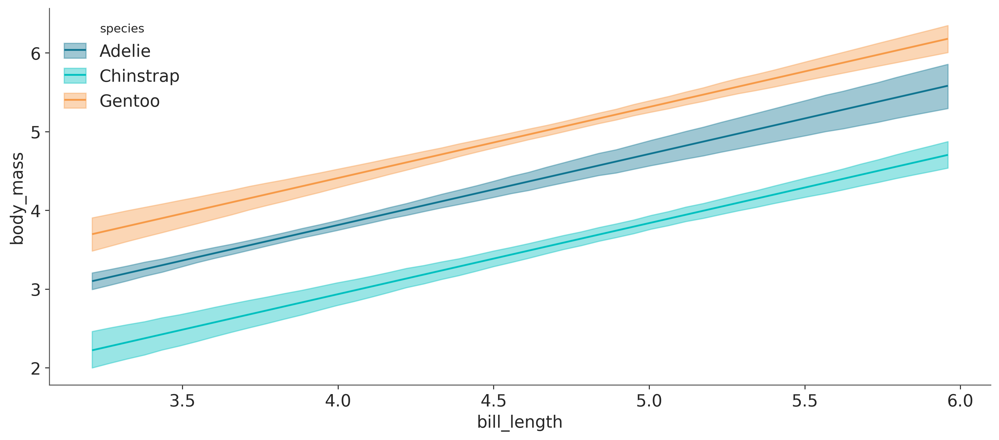

In [76]:
bmb.interpret.plot_predictions(modelo_p, idata_p, ["bill_length",  "species"]);

In [30]:

species = pd.Categorical(penguins.species).codes[::None]
with pm.Model() as model_cp:
    α = pm.Normal("α", 0, 1)
    β_0 = pm.Normal("β_0", 0, 1)
    β_1 = pm.ZeroSumNormal("β_1", 1, shape=3)
    σ = pm.HalfNormal("σ", 1)
    
    μ = α + β_0 * penguins.bill_length + β_1 @ species
    pm.Normal("body_mass", mu=μ, sigma=σ, observed=penguins.body_mass)
    idata_cp = pm.sample()

ValueError: Incompatible Elemwise input shapes [(3,), (333,)]

### Relación con modelos jerárquicos


En el @sec-hierarchical-models analizamos y contrastamos los modelos agrupados y jerárquicos (o parcialmente agrupados). Allí mostramos que a menudo podemos aprovechar la estructura o las jerarquías de los datos. Siguiendo la lógica de ese capítulo, se podría argumentar que `Adelie`, `Gentoo` y `Chinstrap`, aunque son especies diferentes, son todos pingüinos. Por lo tanto, modelar jerárquicamente sus masas corporales puede ser una buena idea. Entonces, ¿Cuál es la diferencia entre dicho modelo y el que utilizamos en esta sección?

El factor distintivo reside en las sutilezas de los componentes de pendiente e intersección. En el caso de `model_p` (variables categóricos), la pendiente sigue siendo la misma en las tres especies de pingüinos, mientras que los interceptos pueden variar. `Intercept + 0` para `Adelie`, `Intercept + species[Chinstrap]` para Chinstrap, y `Intercept + species[Gentoo]` para `Gentoo`. Por lo tanto, este modelo resalta los distintos incerceptos manteniendo la pendiente uniforme.

Si, en cambio, hubiéramos construido el modelo jerárquico `body_mass ~ bill_length|species)`, habríamos estado pidiendo una pendiente y un intercepto parcialmente agrupados. Y si en lugar de eso hubiéramos modelado `body_mass ~ (0 + bill_length | specie)` habríamos estado pidiendo una pendiente parcialmente agrupada y un intercepto común.

Entonces, ¿Cuál es mejor modelo? Como siempre, depende, incluso en algunos casos podría ser mejor una combinación de ambos enfoques, ya que no son ideas mutuamente excluyentes. Como ya comentamos, el *mejor* modelo es el que se alinea con los objetivos de tu análisis y proporciona información útil. A menudo es una buena idea explorar múltiples modelos, comparar su desempeño usando criterios apropiados (como los discutidos en el @sec-model_comparison y considerar las implicaciones prácticas de cada modelo  en el contexto de la investigación o proceso de toma de decisiones.

## Interacciones

Un efecto de interacción o interacción estadística, ocurre cuando el efecto de una variable independiente sobre la respuesta cambia dependiendo del valor de otra variable independiente en el mismo modelo. Una interacción puede ocurrir entre dos o más variables. Algunos ejemplos son:


* Eficacia de los medicamentos y edad: un medicamento que funciona mejor en personas mayores que en personas más jóvenes
* Nivel de educación e impacto en los ingresos: Es posible que la educación superior tenga un efecto positivo más fuerte en los ingresos de un género en comparación con el otro, lo que resulta en una interacción entre la educación y el género.
* Efectos del ejercicio y la dieta sobre la pérdida de peso: Podría ser que el efecto de la dieta sobre la pérdida de peso sea pequeño para las personas que hacen nada o poco ejercicio y muy importante para las personas que hacen ejercicio moderado.
* Temperatura y humedad para el crecimiento de los cultivos: El efecto de la temperatura y la humedad en el crecimiento de los cultivos puede depender del tipo de cultivo que se esté cultivando. Algunos cultivos podrían prosperar en condiciones cálidas y húmedas, mientras que otros podrían funcionar mejor en ambientes más fríos y menos húmedos, creando una interacción entre temperatura, humedad y tipo de cultivo.


Tenemos una interacción cuando el efecto combinado de dos o más variables actuando conjuntamente no es igual a la suma de sus efectos individuales. Si tenemos un modelo como 

$$
\mu = \alpha + \beta_0 X_0 + \beta_1 X_1
$$

no podemos modelar un interacción, ya que los efectos son aditivos. La forma más común de modelar una interacción es multiplicando 2 o más variables. Por ejemplo en un modelo como:

$$
\mu = \alpha + \overbrace{\beta_0 X_0 + \beta_1 X_1 }^{\text{término principal}} \; + \underbrace{\beta_3 X_0X_1}_{\text{término de interacción}} 
$$

Es común que al modelar una interacción se incluya también el término principal.

> Multiplicar dos variables puede verse como un truco similar al que usamos para la regresión polinómica (o cualquier transformación de una variable determinada). En lugar de multiplicar un predictor consigo mismo, multiplicamos dos predictores diferentes y obtenemos uno nuevo.


Definir una interacción es fácil; para un modelo PyMC, solo necesitamos multiplicar los dos predictores y agregar un coeficiente más al modelo. Para un modelo de Bambi es aún más fácil, usamos el operador `:`. Veamos un ejemplo de un modelo con y sin interacciones.


In [77]:
# Sin interacción
model_noint = bmb.Model("body_mass ~ bill_depth + bill_length", data=penguins)
idata_noint = model_noint.fit()

# Con interacción
model_int = bmb.Model("body_mass ~ bill_depth + bill_length + bill_depth:bill_length", data=penguins)
idata_int = model_int.fit()                

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [body_mass_sigma, Intercept, bill_depth, bill_length]


Output()

Sampling 4 chains for 1_000 tune and 1_000 draw iterations (4_000 + 4_000 draws total) took 2 seconds.
Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [body_mass_sigma, Intercept, bill_depth, bill_length, bill_depth:bill_length]


Output()

Sampling 4 chains for 1_000 tune and 1_000 draw iterations (4_000 + 4_000 draws total) took 14 seconds.


En la @fig-interaction_vs_noninteraction tenemos el ajuste de regresión media para `bill_depth` evaluado en 5 valores fijos de `bill_length`. A la izquierda tenemos el resultado para `model_noint` (sin interacciones) y a la derecha para `model_int` (con interacciones). Podemos ver que cuando no tenemos interacciones las rectas ajustadas para `bill_ depth` son paralelas en diferentes niveles de `bill_length`. En cambio, cuando tenemos interacciones las rectas ya no son paralelas, precisamente porque el efecto de cambiar `bill_depth` sobre cuánto cambia `body_mass` ya no es constante sino que está modulado por los valores de `bill_length`. Si generás una figura como @fig-interaction_vs_noninteraction, pero fijando `bill_depth` en vez de `bill_length` observarás un fenómeno parecido.

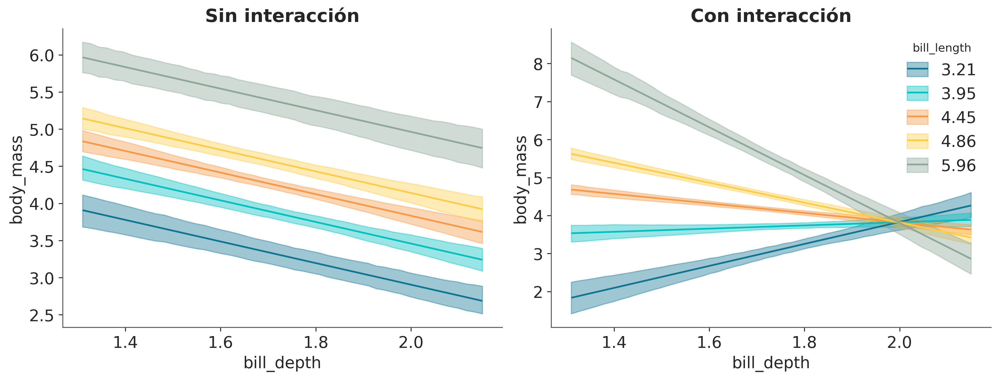

In [78]:
#| code-fold: true
#| label: fig-interaction_vs_noninteraction
#| fig-cap: Comparación de un modelo sin interacción (las lineas se mantienen paralelas) y con interacción (las lineas se cruzan).

_, axes = plt.subplots(1, 2, figsize=(12, 4.5), gridspec_kw={'hspace': 0.1})

bmb.interpret.plot_predictions(model_noint, idata_noint,
                                ["bill_depth",  "bill_length"],
                                ax=axes[0],
                                legend=False,
                                )
axes[0].set_title("Sin interacción")


bmb.interpret.plot_predictions(model_int, idata_int,
                               ["bill_depth",  "bill_length"],
                                ax=axes[1],
                                )
axes[1].set_title("Con interacción");


Acabamos de ver visualmente que interpretar modelos lineales con interacciones no es tan fácil como interpretar modelos lineales sin ellas. Veamos esto matemáticamente.

Supongamos que tenemos un modelo con 2 variables $X_0$ y $X_1$ y una interacción entre ellas:

$$
     \mu = \alpha + \beta_0 X_0 + \beta_1 X_1 + \beta_3 X_0X_1
$$

podemos reescribir este modelo como:

$$
\mu = \alpha + \underbrace{{(\beta_0 + \beta_2} X_1)}_{\text{pendiente de } X_0} X_0 + \beta_1 X_1
$$

o así:

$$
\mu = \alpha + \beta_0 X_0 + \underbrace{(\beta_1 + \beta_2 x_0)}_{\text{pendiente de } X_1} X_1
$$

A partir de esta expresión podemos ver que:

* ¡El término de interacción puede entenderse como un modelo lineal dentro de un modelo lineal!
* La interacción es simétrica; podemos pensar en ello como la pendiente de $x_0$ en función de $x_1$ y al mismo tiempo como la pendiente de $x_1$ en función de $x_0$. Esto también se puede ver en la figura interactiva.
* Sabemos desde antes que el coeficiente $\beta_0$ se puede interpretar como la cantidad de cambio de $\mu$ por unidad de cambio de $x_0$ (por eso lo llamamos pendiente). Si agregamos un término de interacción, entonces esto solo es cierto en $x_1 = 0$. Intente utilizar la figura interactiva para verlo usted mismo. Matemáticamente, esto es cierto porque cuando $x_1 = 0$ entonces $\beta_2x_1 = 0$, y por lo tanto la pendiente de $x_0$ se reduce a $\beta_0 x_0$. Por simetría, el mismo razonamiento se puede aplicar a $\beta_1$.

## Interpretando modelos con Bambi

Ya hemos usado `bmb.interpret_plot_predictions` en este capítulo. Pero esa no es la única herramienta que nos ofrece Bambi para ayudarnos a comprender los modelos. Otra opción es `bmb.interpret_plot_comparisons`. Esta herramienta nos ayuda a responder la pregunta: ¿Cuál es la diferencia predictiva esperada cuando comparamos dos valores de una variable determinada mientras mantenemos el resto en valores constantes?


Como ejemplo usemos `model_int`, que ya ajustamos en la sección anterior.

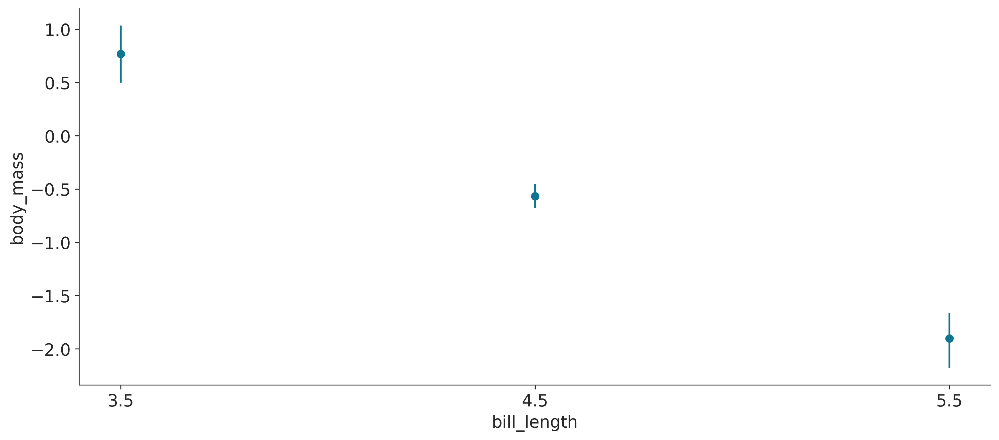

In [79]:
#| label: fig-interaction_comparisons
#| fig-cap: Contraste de para `bill_length` de 1,8 a 1,4 cm para 3 valores fijos de `bill_length`, 3.5, 4.5 y 5.5.

bmb.interpret.plot_comparisons(model_int, idata_int,
                               contrast={"bill_depth":[1.4, 1.8]},
                               conditional={"bill_length":[3.5, 4.5, 5.5]});

La figura anterior muestra que al comparar un pingüino hipotético con profundidad de pico (`bill_depth`) de 1,8 con uno con profundida de pico de 1,4, la diferencia esperada es:

* aproximadamente 0,8 kg para un pico de 3,5 de longitud
* -0,7 kg para un pico de 4,5 de largo
* aproximadamente -2 kg para un pico de 5,5 de largo


Para obtener esta misma información, pero en forma de tabla podemos usar la función `bmb.interpret.comparisons` y obtendremos un DataFrame de Pandas.

In [80]:
#| code-fold: true
bmb.interpret.comparisons(model_int, idata_int,
                          contrast={"bill_depth":[1.4, 1.8]},
                          conditional={"bill_length":[3.5, 4.5, 5.5]})

,term,estimate_type,value,bill_length,estimate,lower_3.0%,upper_97.0%
0,bill_depth,diff,"(1.4, 1.8)",3.5,0.768417,0.498433,1.035196
1,bill_depth,diff,"(1.4, 1.8)",4.5,-0.566772,-0.674116,-0.455068
2,bill_depth,diff,"(1.4, 1.8)",5.5,-1.901961,-2.178738,-1.664387


Otra función muy útil es Otra función útil es `bmb.interpret_plot_slopes`. Esta función es similar a `bmb.interpret_plot_comparison`, la "tasa de cambio instantánea" o pendiente en un valor dado.

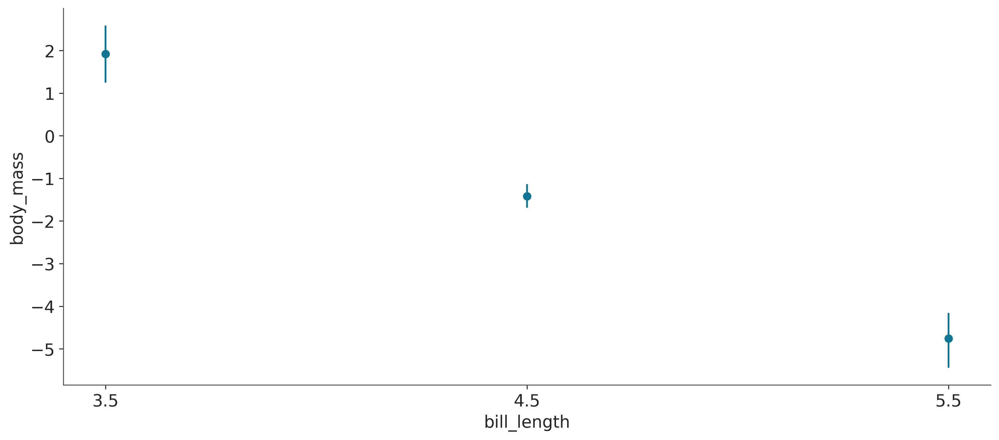

In [81]:
#| label: fig-interaction_slopes
#| fig-cap: Comparación de las pendientes de bill_depth evaluada en 1.8 para tres valores de `bill_length`, 3.5, 4.5 y 5.5.

bmb.interpret.plot_slopes(model_int, idata_int,
                          wrt={"bill_depth":1.8},
                          conditional={"bill_length":[3.5, 4.5, 5.5]});

La @fig-interaction_slopes muestra que las pendientes para `bill_depth` en 1.8 son:

* $\approx$ 2 kg/cm para un largo de pico de 3.5
* -1.4 kg/cm para un largo de pico de 4.5
* $\approx$ -5 kg/cm para un largo de pico de 5.5


Si deseas esta información en forma tabular, podés usar: la función `bmb.interpret.slopes` y obtendrás un DataFrame en lugar de un gráfico.


In [82]:
#| code-fold: true

bmb.interpret.slopes(model_int, idata_int,
                     wrt={"bill_depth":1.8},
                     conditional={"bill_length":[3.5, 4.5, 5.5]})

,term,estimate_type,value,bill_length,estimate,lower_3.0%,upper_97.0%
0,bill_depth,dydx,"(1.8, 1.8001)",3.5,1.921043,1.246082,2.587990
1,bill_depth,dydx,"(1.8, 1.8001)",4.5,-1.416930,-1.685290,-1.137671
2,bill_depth,dydx,"(1.8, 1.8001)",5.5,-4.754903,-5.446846,-4.160967



En esta sección, apenas hemos arañado la superficie de lo que podemos hacer con las herramientas del módulo `bmb.interpret`. Este módulo es una característica muy útil de Bambi, especialmente para modelos con interacciones y/o modelos con funciones de enlace distintas a la función de identidad. Les recomiendo que lea la [documentación](https://bambinos.github.io/bambi/notebooks/#tools-to-interpret-model-outputs) de Bambi para obtener más ejemplos y detalles que no se tratan aquí.

## Ejercicios

1. En la siguiente definición de modelo probabilístico cual es el _likelihood_, cual es el _a priori_ y cual el _a posteriori_.

$$
\begin{aligned}
y_i &\sim Normal(\mu, \sigma) \\
\mu &\sim Normal(0, 10) \\
\sigma &\sim HalfNormal(25)
\end{aligned}
$$

2. En el modelo del punto 1 ¿cuántos parámetros hay en el posterior? o expresado de otra forma ¿cuántas dimensiones tiene el _a posteriori_?

3. En el siguiente modelo ¿cuál es el modelo lineal? ¿cuál el likelihood y cuantos parámetros hay en la distribución a posteriori?

$$
\begin{aligned}
y &\sim Normal(\mu, \epsilon) \\
\mu &= \alpha + \beta x \\
\alpha &\sim Normal(0, 10) \\
\beta &\sim Normal(0, 1) \\
\epsilon &\sim HalfNormal(25) \\
\end{aligned}
$$


4. Usando el conjunto de datos `howell` (disponible junto con esta notebook) realice un modelo lineal del peso ($x$) versus la altura ($y$). Excluya a los menores de 18 años. Exponga los resultados.

5. Para 4 individuos se registraron los pesos (45.73, 65.8, 54.2, 32.59), pero no las alturas. Usando el modelo del punto anterior prediga la altura esperada para cada individuo junto con un intervalo de credibilidad del 50% y del 89%.

6. Repita el punto 4 pero para los menores de 18 años. Exponga los resultados.


7. Use el modelo `modelo_bl` pero aplicada al conjunto de datos iris. Intente clasificar setosa o versicolor en función de `sepal_length`. ¿Cuán útil es este modelo comparado con una regresión logística? 

8. Vuelva a correr el `modelo_rl` pero esta vez usando la variable `petal_width` ¿En que difieren los resultados? ¿Cuán ancho o angosto es el intervalo HDI 94%? 


9. Lea este [post](https://twiecki.github.io/blog/2017/02/08/bayesian-hierchical-non-centered/) y replique los resultados usted mismo.